In [1]:
import pandas as pd
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import SpectralClustering
from sklearn.manifold import TSNE
from sklearn.manifold import Isomap
from sklearn.decomposition import PCA
from sklearn.preprocessing import normalize, StandardScaler
import numpy as np
import scipy.cluster.hierarchy as shc
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import cophenet
from scipy.spatial.distance import pdist
import seaborn as sns
from ast import literal_eval
import plotly.express as px
import plotly.graph_objects as go
import os

/home/gkrenzer/anaconda3/lib/python3.9/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.25.2
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [2]:
fs = 15
s = 50

In [3]:
data = pd.read_csv('data_mac_labelled_using_icsd.csv')
#data = pd.read_csv('data_pc.csv')
data

,Unnamed: 0.1,Unnamed: 0,material_id,elements,formula_pretty_reduced,formula,icsd_id,num_elements,chemsys,spacegroup_symbol,...,0.3,0.4,0.5,0.6,1e-05,0.0001,0.001,0.01,σ(RT)(S cm-1),Conductor?
0,0,0,mp-8892,"['Li', 'F', 'In']",LiInF4,Li4 In4 F16,[66693.0],3,F-In-Li,Pbcn,...,9.927689,9.927689,9.927689,9.927689,0.993939,0.981707,0.962025,0.788732,NaN,NaN
1,1,1,mp-772968,"['Li', 'Tl', 'P', 'H', 'O']",LiTlPHO3,Li4 Tl4 P4 H4 O12,[201040.0],5,H-Li-O-P-Tl,C2,...,11.140249,14.066884,14.066884,14.066884,1.000000,0.925000,0.725000,0.555556,NaN,NaN
2,2,2,mp-756951,"['Li', 'Sb', 'O']",LiSbO3,Li4 Sb4 O12,[nan],3,Li-O-Sb,C2/m,...,5.543978,5.543978,5.543978,6.903721,1.000000,0.993865,0.906832,0.560606,NaN,NaN
3,3,3,mp-754856,"['Li', 'Y', 'Zr', 'S']",Li7Y7ZrS16,Li7 Y7 Zr1 S16,[nan],4,Li-S-Y-Zr,P2/m,...,4.319241,4.319241,5.047983,5.047983,0.987952,0.962963,0.921569,0.735294,NaN,NaN
4,4,4,mp-24610,"['H', 'Li', 'O', 'P']",LiP(HO2)2,Li4 P4 H8 O16,"[182309.0, 182308.0, 100200.0]",4,H-Li-O-P,Pna2_1,...,32.155099,32.155099,32.155099,32.155099,1.000000,0.988506,0.941860,0.537500,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
862,862,868,mp-9919,"['Li', 'Zn', 'Sb']",LiZnSb,Li2 Zn2 Sb2,"[642350.0, 42064.0]",3,Li-Sb-Zn,P6_3mc,...,7.108637,7.108637,7.108637,7.108637,0.987578,0.968750,0.876623,0.664286,NaN,NaN
863,863,869,mp-14704,"['Li', 'B', 'O', 'Y']",Li6Y(BO3)3,Li24 Y4 B12 O36,"[184290.0, 184288.0, 184285.0, 68653.0, 184287...",4,B-Li-O-Y,P2_1/c,...,6.508700,7.567257,11.272210,11.272210,1.000000,0.982143,0.812500,0.742574,NaN,NaN
864,864,870,mp-557756,"['Li', 'Zn', 'P', 'O']",Li4Zn(PO4)2,Li16 Zn4 P8 O32,[59640.0],4,Li-O-P-Zn,P2_1/c,...,8.758697,8.758697,8.758697,10.855064,1.000000,0.967480,0.811475,0.700935,NaN,NaN
865,865,871,mp-966801,"['Li', 'Ca', 'B', 'O']",LiCaBO3,Li8 Ca8 B8 O24,[nan],4,B-Ca-Li-O,Ibca,...,10.040524,10.040524,10.040524,10.040524,0.989011,0.933333,0.771084,0.735294,NaN,NaN


### Load features

In [4]:
s = len(data)

s

867

In [5]:
#import temperature dependent and independent phonon band centre (average frequency) data

#fav = temperature independent
fav = data['fav'].to_numpy().reshape(s, 1)
fav_tot = data['fav_tot'].to_numpy().reshape(s, 1)

#fav_RT = temperature dependent (room temperature)
fav_RT = data['298'].to_numpy().reshape(s, 1)
fav_RTot = data['298_tot'].to_numpy().reshape(s, 1)

In [6]:
#calculate the difference between total and Li phonon band centre
d_fav = fav_tot - fav
d_favRT = fav_RTot - fav_RT

In [7]:
#Frequency of the first peak found in the DOS using scipy find_peaks() function
first_peak_02 = data['0.2'].to_numpy().reshape(s, 1)
first_peak_05 = data['0.5'].to_numpy().reshape(s, 1)

In [8]:
#relative width  and spread
rel_s_05 = data['1e-05'].to_numpy().reshape(s, 1)

In [9]:
#add conductivity labels
#Mac
fast_ion = [766, 13, 458, 322, 325, 424, 58]
slow_ion = [353, 542, 547, 401, 464, 587, 108, 827, 354]
#PC
#fast_ion = [122, 861, 202, 860, 859, 608]
#slow_ion = [295, 211, 191, 16, 40, 300, 181, 387]

In [10]:
#add composition labels

#rewrite list
elements_str = data['elements'].tolist()
elements_list = []   
for mat in elements_str:
    s_to_l = literal_eval(mat)
    elements_list.append(s_to_l)
    
#list comprehension
enum = [(i, j) for i, j in enumerate(elements_list)]

#store indexes in different lists
oxides = [tup[0] for tup in enum if 'O' in tup[1]]
h_containing = [tup[0] for tup in enum if 'H' in tup[1]]
silicides = [tup[0] for tup in enum if 'Si' in tup[1]]
fluorides = [tup[0] for tup in enum if 'F' in tup[1]]
chlorides = [tup[0] for tup in enum if 'Cl' in tup[1]]
bromides = [tup[0] for tup in enum if 'Br' in tup[1]]
iodides = [tup[0] for tup in enum if 'I' in tup[1]]
halides = fluorides+chlorides+bromides+iodides
selenides = [tup[0] for tup in enum if 'Se' in tup[1]]
tellurides = [tup[0] for tup in enum if 'Te' in tup[1]]
sulfides = [tup[0] for tup in enum if 'S' in tup[1]]
chalcogenides = selenides+tellurides+sulfides
nitrides = [tup[0] for tup in enum if 'N' in tup[1]]
phosphides = [tup[0] for tup in enum if 'P' in tup[1]]
arsenides = [tup[0] for tup in enum if 'As' in tup[1]]
antimony = [tup[0] for tup in enum if 'Sn' in tup[1]]
bismuth = [tup[0] for tup in enum if 'Bi' in tup[1]]
pnictides = nitrides+phosphides+arsenides+antimony+bismuth

#check repartition
print('Oxides: '+str(len(oxides)))
print('H-containing: '+str(len(h_containing)))
print('Halides: '+str(len(halides)))
print('Chalcogenides: '+str(len(chalcogenides)))
print('Pnictides: '+str(len(pnictides)))

Oxides: 479
H-containing: 64
Halides: 202
Chalcogenides: 147
Pnictides: 258


In [11]:
#Create a vector of phonon band centres at different temperatures for clustering
T = data.iloc[:, 12:111]
sample = []
for i in [*range(0,s-1)]:
    sample.append(T.iloc[i,:].tolist())

In [12]:
T = data.iloc[:, 14:113]
T

,298,10,20,30,40,50,60,70,80,90,...,890,900,910,920,930,940,950,960,970,980
0,4.818449,0.655300,1.338639,1.857266,2.288379,2.700182,3.140156,3.623395,4.134484,4.645524,...,9.618626,9.622918,9.627107,9.631197,9.635190,9.639090,9.642901,9.646625,9.650265,9.653824
1,2.367749,0.425175,0.640392,0.914355,1.218305,1.494725,1.741277,1.982415,2.243315,2.538255,...,9.795458,9.804592,9.813504,9.822202,9.830693,9.838985,9.847085,9.854999,9.862734,9.870295
2,5.131261,0.260459,0.536256,0.923502,1.476863,2.171881,2.893005,3.547299,4.100839,4.555811,...,7.531032,7.533812,7.536527,7.539180,7.541773,7.544308,7.546787,7.549212,7.551584,7.553905
3,4.336147,0.190350,0.786910,1.639525,2.669479,3.488601,4.031715,4.388840,4.633861,4.810163,...,5.746739,5.747567,5.748375,5.749165,5.749937,5.750691,5.751430,5.752152,5.752858,5.753550
4,3.616297,0.168749,0.310046,0.552958,0.828266,1.088393,1.318507,1.519447,1.696579,1.855436,...,19.874561,19.990915,20.104714,20.216033,20.324942,20.431509,20.535803,20.637886,20.737823,20.835672
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
862,3.043330,0.717046,1.189952,1.631307,2.219700,2.825992,3.346013,3.757426,4.074966,4.320304,...,5.692300,5.693411,5.694497,5.695558,5.696595,5.697609,5.698600,5.699569,5.700516,5.701444
863,5.318453,0.264900,0.505346,0.781442,1.097449,1.454042,1.839939,2.239718,2.640009,3.030925,...,8.638030,8.646174,8.654130,8.661905,8.669505,8.676937,8.684205,8.691314,8.698270,8.705078
864,5.143890,0.310105,0.605696,0.971054,1.365045,1.762990,2.178050,2.624586,3.100819,3.592252,...,9.955034,9.961839,9.968482,9.974967,9.981302,9.987490,9.993537,9.999447,10.005226,10.010877
865,5.940083,0.198132,0.582146,1.173296,1.796243,2.412863,3.022988,3.617137,4.176904,4.686676,...,8.857754,8.861610,8.865376,8.869055,8.872650,8.876164,8.879599,8.882959,8.886245,8.889461


In [13]:
print(np.shape(sample))
sample

(866, 99)


[[8.450140215617727,
  8.70187803385358,
  4.818448715844465,
  0.6553000769683154,
  1.3386385837036985,
  1.8572664545694213,
  2.288379041856573,
  2.700182425423689,
  3.140156351952556,
  3.623395125620783,
  4.134484159408668,
  4.645523808664636,
  5.131893047420361,
  5.578431641294581,
  5.978892503982665,
  6.333078264846317,
  6.644106247038215,
  6.916518436585168,
  7.155179776390142,
  7.364717390976187,
  7.549280681369825,
  7.7124739670702,
  7.857373538830739,
  7.986580657688652,
  8.102285493358274,
  8.20633001181779,
  8.300264713110195,
  8.385397602970249,
  8.462835435673169,
  8.533517969190514,
  8.59824620209923,
  8.657705565278222,
  8.712484949248779,
  8.763092324323663,
  8.809967585866145,
  8.853493143868402,
  8.894002679032155,
  8.93178840678032,
  8.967107124610724,
  9.000185264803815,
  9.03122313156796,
  9.060398467304768,
  9.08786946514126,
  9.11377732283174,
  9.138248415463256,
  9.161396150210882,
  9.183322554969738,
  9.204119643475025

In [14]:
dir = 'final_10to35_4/'

In [15]:
#load all, total and Li DOS feature vectors
tot_fv = np.load('vibtot_feature.npy')
li_fv = np.load('vibli_feature.npy')
all_fv = np.load('viball_feature.npy')

print(np.shape(li_fv))
print(np.shape(all_fv))

(867, 180)
(867, 360)


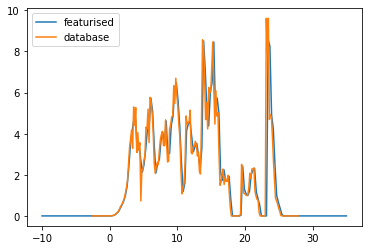

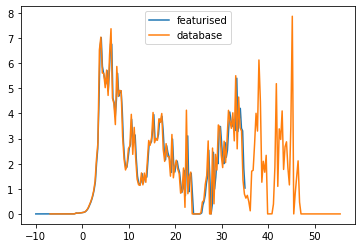

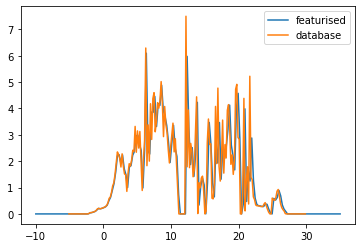

In [16]:
#test featurised and original DOS are consistent after df.drop()
#make sure materials of feature vectors match materials in dataframe
folder_path = '/Users/gabrielkrenzer/Documents/PhD/projects/unsupervised_ml/dat'
data_pre = pd.read_csv('data_mac_pre_process.csv')

for post_idx in [7, 363, 854]:
    mat_id = data.at[post_idx, 'material_id']
    pre_idx = data_pre[data_pre.material_id == mat_id].index.values[0]
    
    
    
    fig, ax = plt.subplots()
    pre_dos = np.loadtxt(os.path.join(folder_path, "total_dos_{0}.dat".format(pre_idx)),unpack = True)
    post_dos = tot_fv[post_idx]
    post_freq = np.linspace(-10, 35, len(post_dos))
    plt.plot(post_freq, post_dos, label='featurised')
    plt.plot(pre_dos[0], pre_dos[1], label='database')
    plt.legend()
    plt.show()


In [17]:
#load Li DOS feature vectors after dimensionality reduction with VAE and AE
li_fvae = np.load(dir+'lidos_f_vae.npy')
li_fae = np.load(dir+'lidos_f_ae.npy')

### Hierarchical Clustering Using Dendograms

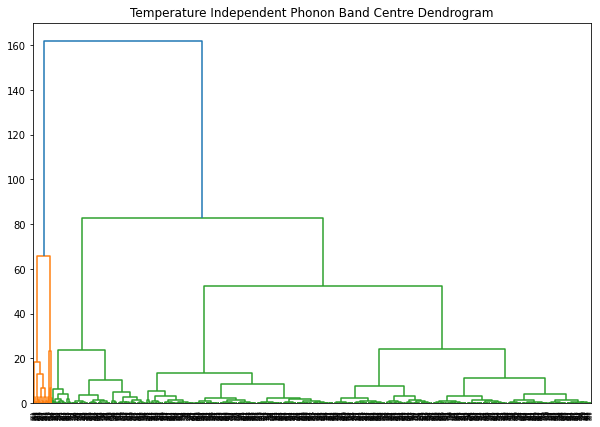

In [21]:
#Perform the Hierarchical Clustering
#temperature independent - clusters_1

plt.figure(figsize=(10, 7))
plt.title("Temperature Independent Phonon Band Centre Dendrogram")

fav_graph = np.array(fav)
fav_graph = fav_graph.reshape(-1,1)
selected_data = fav_graph
clusters_1 = shc.linkage(selected_data,
            method='ward',
            metric="euclidean")
#optional: set color for links
#shc.set_link_color_palette(['#232425','#ed1c24','#2b3980'])
shc.dendrogram(clusters_1)
plt.show()

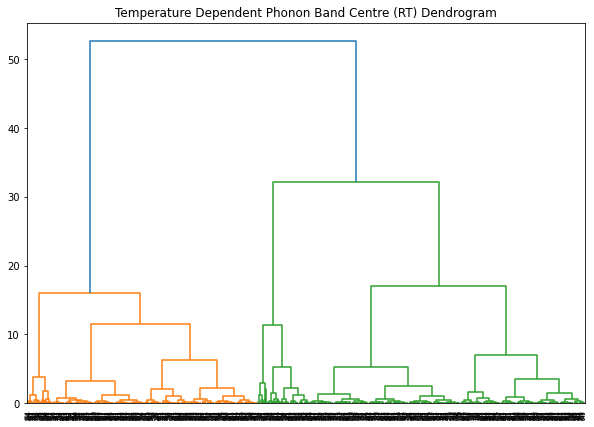

In [22]:
#Perform the Hierarchical Clustering
#temperature dependent (room temperature) - clusters_2
plt.figure(figsize=(10, 7))
plt.title("Temperature Dependent Phonon Band Centre (RT) Dendrogram")

favRT_graph = np.array(fav_RT)
favRT_graph = favRT_graph.reshape(-1,1)
selected_data = favRT_graph
clusters_2 = shc.linkage(selected_data,
            method='ward',
            metric="euclidean")
shc.dendrogram(clusters_2)
plt.show()

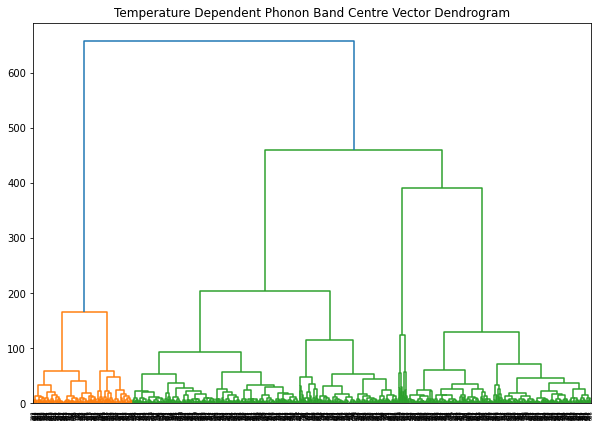

In [23]:
#Perform the Hierarchical Clustering
#temperature dependent (vector of phonon band centres at different temperatures)
plt.figure(figsize=(10, 7))
plt.title("Temperature Dependent Phonon Band Centre Vector Dendrogram")

selected_data = sample
clusters_3 = shc.linkage(selected_data,
                         method='ward',
                         metric="euclidean")
shc.dendrogram(clusters_3)
plt.show()

height of that horizontal line tells you about the distance at which this label was merged into another label or cluster

### Cophenetic Correlation Coefficient

check the Cophenetic Correlation Coefficient , compares (correlates) the actual pairwise distances of all your samples to those implied by the hierarchical clustering. The closer the value is to 1, the better the clustering preserves the original distances

In [24]:
c, coph_dists = cophenet(clusters_1, pdist(fav_graph))
c

0.7766044549905247

In [25]:
c, coph_dists = cophenet(clusters_2, pdist(favRT_graph))
c

0.5862739705855536

In [26]:
c, coph_dists = cophenet(clusters_3, pdist(sample))
c

0.5706674990035805

### Cluster Variance

In [27]:
def var_n_clusters (mini, maxi, column):
    '''give a list of variance with different number of clusters used in Hierarchical Clustering'''
    
    temp = pd.DataFrame(data[column])
    val = np.array(data[column])
    val = val.reshape(-1, 1)
    n_range = [*range(mini, maxi+1)]
    store = pd.DataFrame(data = n_range, columns = ['n_clusters'])
    store['sum_var']=np.nan
    
    for n in n_range:
        clustering_model = AgglomerativeClustering(n, affinity='euclidean', linkage='ward').fit(val)
        label = clustering_model.labels_
        label = pd.DataFrame(label)
        label.columns = ['label']
        temp = pd.concat([temp, label], axis = 1)
        record = pd.DataFrame(data = [*range(0,n)])
        for label in [*range(0,n)]:
            record.loc[label,1] = temp.loc[temp['label']== label][column].var()
        record.columns = ['label','variance']
        sum_var = record['variance'].sum()
        index = store.index[store['n_clusters'] == n].tolist()
        store.at[index[0],'sum_var'] = sum_var
        temp = temp.drop('label', axis=1)
    
    return store

/Users/gabrielkrenzer/anaconda3/lib/python3.8/site-packages/sklearn/cluster/_agglomerative.py:1005: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(
/Users/gabrielkrenzer/anaconda3/lib/python3.8/site-packages/sklearn/cluster/_agglomerative.py:1005: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(
/Users/gabrielkrenzer/anaconda3/lib/python3.8/site-packages/sklearn/cluster/_agglomerative.py:1005: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(
/Users/gabrielkrenzer/anaconda3/lib/python3.8/site-packages/sklearn/cluster/_agglomerative.py:1005: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(
/Users/gabrielkrenzer/anaconda3/lib/python3.8/site-packages/sklearn/clus

   n_clusters     sum_var
0           2  102.024717
1           3  100.694993
2           4   69.303525
3           5   68.068065
4           6   67.622657
5           7   66.685276
6           8   26.355318
7           9   20.954444
8          10   20.907825


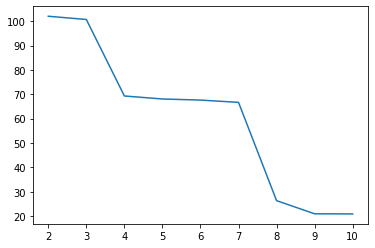

In [28]:
fav_var = var_n_clusters(2,10,'fav')
plt.plot(fav_var['n_clusters'],fav_var['sum_var'])
print(fav_var)

/Users/gabrielkrenzer/anaconda3/lib/python3.8/site-packages/sklearn/cluster/_agglomerative.py:1005: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(
/Users/gabrielkrenzer/anaconda3/lib/python3.8/site-packages/sklearn/cluster/_agglomerative.py:1005: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(
/Users/gabrielkrenzer/anaconda3/lib/python3.8/site-packages/sklearn/cluster/_agglomerative.py:1005: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(
/Users/gabrielkrenzer/anaconda3/lib/python3.8/site-packages/sklearn/cluster/_agglomerative.py:1005: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(
/Users/gabrielkrenzer/anaconda3/lib/python3.8/site-packages/sklearn/clus

   n_clusters   sum_var
0           2  2.250588
1           3  2.247468
2           4  2.047064
3           5  1.953351
4           6  1.841217
5           7  1.495487
6           8  1.410574
7           9  1.334091
8          10  1.191266


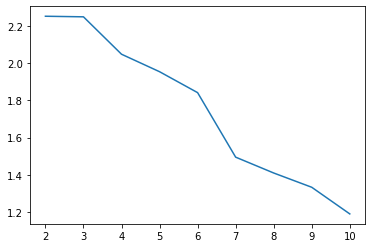

In [29]:
favT_var = var_n_clusters(2,10,'298')
plt.plot(favT_var['n_clusters'],favT_var['sum_var'])
print(favT_var)

In [30]:
def var_n_clusters (mini, maxi, data):
    '''give a list of variance with different number of clusters used in Hierarchical Clustering'''
    
    #data stored in [n_samples, n_features] format
    val = data
    #number of clusters to test on
    n_range = [*range(mini, maxi+1)]
    #create dataframe to store variance for different numbers of clusters
    store = pd.DataFrame(data = n_range, columns = ['n_clusters'])
    store['sum_var']=np.nan
    for n in n_range:
        clustering_model = AgglomerativeClustering(n, affinity='euclidean', linkage='ward').fit(val)
        labels = clustering_model.labels_
        record = []
        for l in [*range(0,n)]:
            store_match = []
            index = np.where(labels==l)
            for i in index:
                match = val[i]
                store_match.append(match) 
            var = np.array(store_match).var()
            record.append(var)
        sum_var = sum(record)
        index = store.index[store['n_clusters'] == n].tolist()
        store.at[index[0],'sum_var'] = sum_var
    
    return store

### Silhouette Analysis

In [31]:
#Silhouette analysis
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score

import matplotlib.pyplot as plt
import matplotlib.cm as cm

def silhouette_for_clusters (range_n_clusters, sample, agglomerative = False, kmeans = False, spectral = False):
    '''calculate silhouette score for different number of clusters and plot graphs for comparing
    range_n_clusters = a list of integer
    sample = a list of value to perform clustering on
    method = agglomerative or kmeans or spectral'''

    for n_clusters in range_n_clusters:
        fig, (ax1, ax2) = plt.subplots(1, 2)
        fig.set_size_inches(18, 7)

        # The 1st subplot is the silhouette plot
        # The silhouette coefficient can range from -1, 1 but in this example all
        # lie within [-0.1, 1]
        ax1.set_xlim([-0.1, 1])
        ax1.set_ylim([0, len(sample) + (n_clusters + 1) * 10])

        if agglomerative is True:
            clusterer = AgglomerativeClustering(n_clusters, affinity='euclidean', linkage='ward').fit(sample)
            cluster_labels = clusterer.labels_

        elif kmeans is True:
            clusterer = KMeans(n_clusters=n_clusters, random_state=10)
            cluster_labels = clusterer.fit_predict(sample)

        elif spectral is True:
            clusterer = SpectralClustering(n_clusters=n_clusters, random_state=10)
            cluster_labels = clusterer.fit_predict(sample)

        elif agglomerative is False and kmeans is False and spectral is False:
            raise Exception("one method is needed to be True")

        elif agglomerative is True and kmeans is True and spectral is True:
            raise Exception("one method is needed to be False")


        silhouette_avg = silhouette_score(sample, cluster_labels)
        print(
            "For n_clusters =",
            n_clusters,
            "The average silhouette_score is :",
            silhouette_avg,
        )

        # Compute the silhouette scores for each sample
        sample_silhouette_values = silhouette_samples(sample, cluster_labels)

        y_lower = 10
        for i in range(n_clusters):

            ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

            ith_cluster_silhouette_values.sort()

            size_cluster_i = ith_cluster_silhouette_values.shape[0]
            y_upper = y_lower + size_cluster_i

            color = cm.nipy_spectral(float(i) / n_clusters)
            ax1.fill_betweenx(
                np.arange(y_lower, y_upper),
                0,
                ith_cluster_silhouette_values,
                facecolor=color,
                edgecolor=color,
                alpha=0.7,
            )

            ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

            y_lower = y_upper + 10

        ax1.set_title("The silhouette plot for the various clusters.")
        ax1.set_xlabel("The silhouette coefficient values")
        ax1.set_ylabel("Cluster label")


        ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

        ax1.set_yticks([])
        ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

        # 2nd Plot showing the actual clusters formed
        #colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
        ax2.scatter(
            sample[:][0], sample[:][-1], marker=".", s=30, lw=0, alpha=0.7, c="red", edgecolor="k"
        )

        if kmeans is True:
            centers = clusterer.cluster_centers_
            ax2.scatter(
                centers[:, 0],
                centers[:, -1],
                marker="o",
                c="white",
                alpha=1,
                s=200,
                edgecolor="k",
            )

            for i, c in enumerate(centers):
                ax2.scatter(c[0], c[-1], marker="$%d$" % i, alpha=1, s=50, edgecolor="k")

        ax2.set_title("The visualization of the clustered data.")
        ax2.set_xlabel("Feature space for the 1st feature")
        ax2.set_ylabel("Feature space for the 2nd feature")

        plt.suptitle(
            "Silhouette analysis for KMeans clustering on sample data with n_clusters = %d"
            % n_clusters,
            fontsize=14,
            fontweight="bold",
        )

    plt.show()

For n_clusters = 2 The average silhouette_score is : 0.4887363693600624


/Users/gabrielkrenzer/anaconda3/lib/python3.8/site-packages/sklearn/cluster/_agglomerative.py:1005: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(
/Users/gabrielkrenzer/anaconda3/lib/python3.8/site-packages/sklearn/cluster/_agglomerative.py:1005: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


For n_clusters = 3 The average silhouette_score is : 0.3874995292631468
For n_clusters = 4 The average silhouette_score is : 0.3997447235579774


/Users/gabrielkrenzer/anaconda3/lib/python3.8/site-packages/sklearn/cluster/_agglomerative.py:1005: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(
/Users/gabrielkrenzer/anaconda3/lib/python3.8/site-packages/sklearn/cluster/_agglomerative.py:1005: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(
/Users/gabrielkrenzer/anaconda3/lib/python3.8/site-packages/sklearn/cluster/_agglomerative.py:1005: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


For n_clusters = 5 The average silhouette_score is : 0.33863433488830663
For n_clusters = 6 The average silhouette_score is : 0.3401834960286266


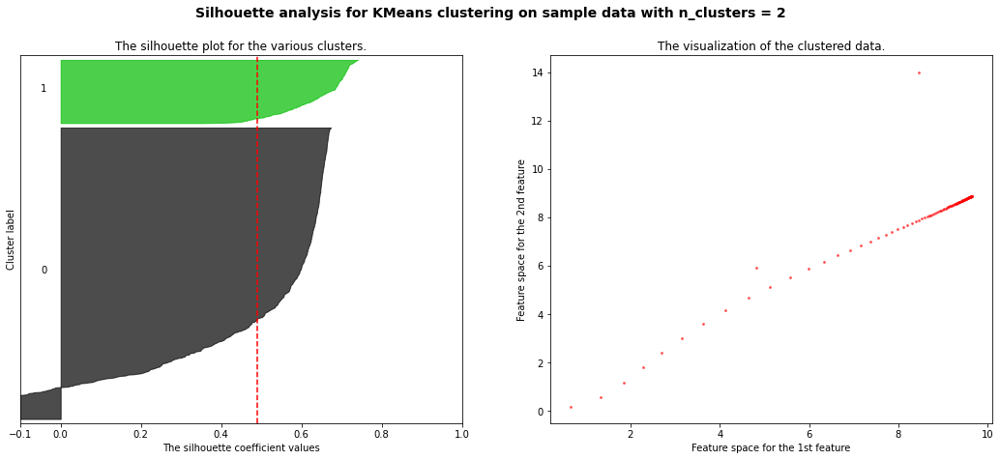

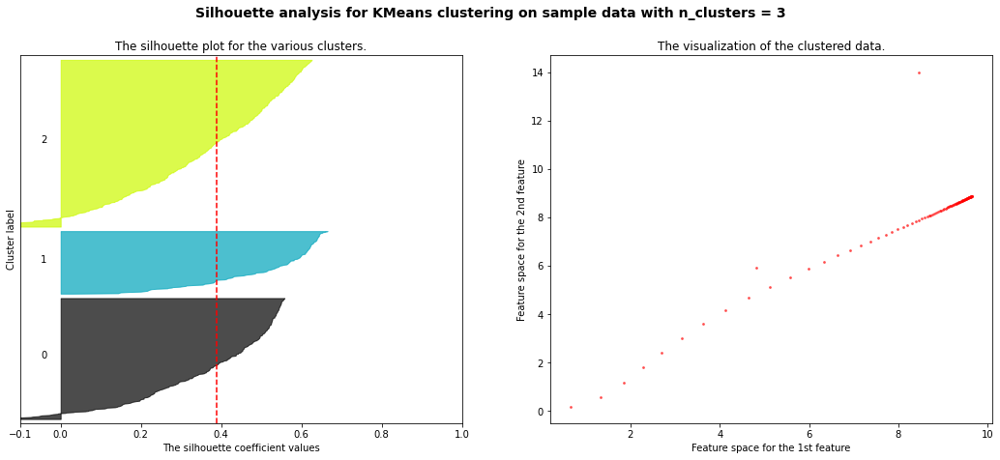

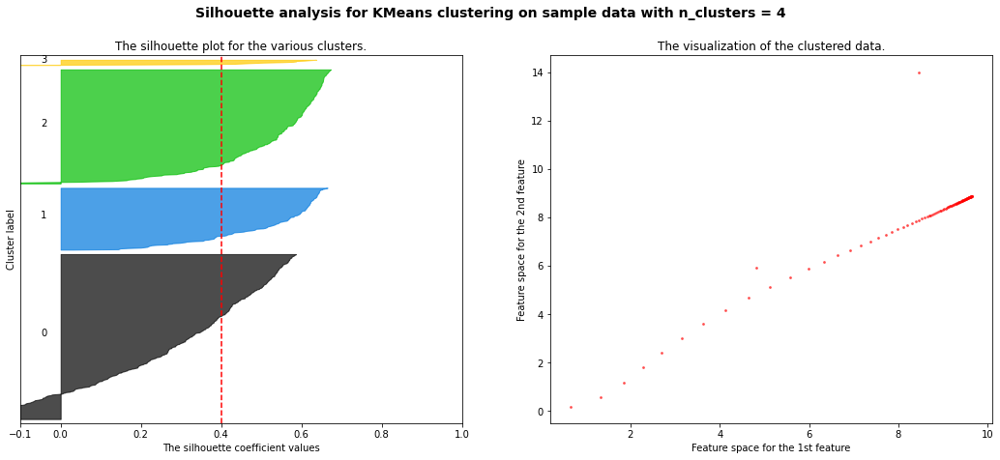

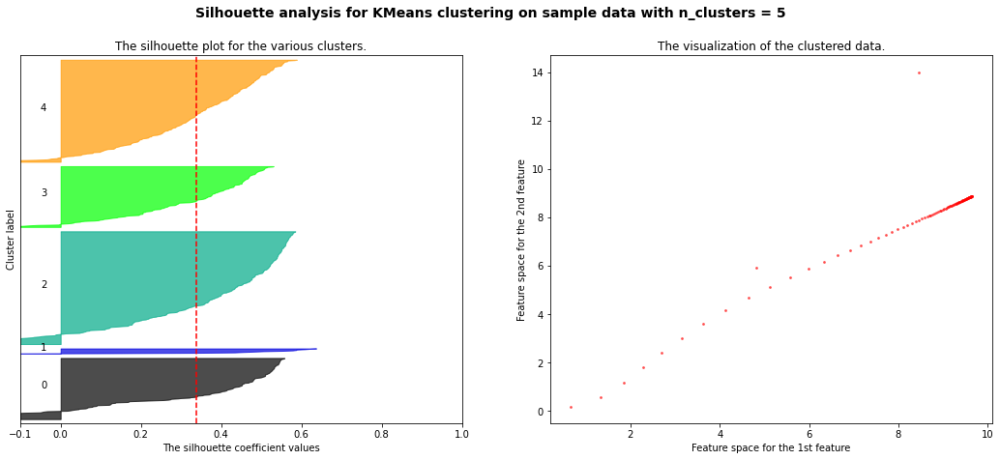

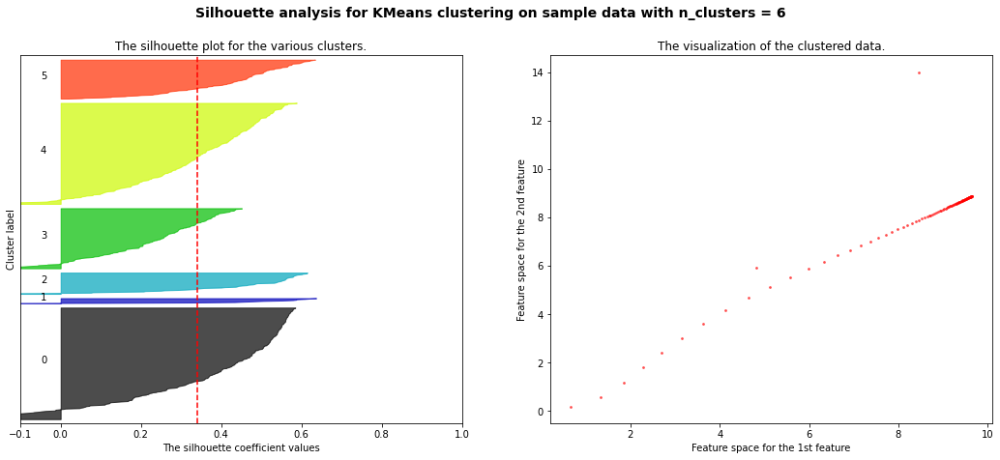

In [32]:
#example of performing the silhouette analysis
range_n_clusters = [2, 3, 4, 5, 6]

silhouette_for_clusters(range_n_clusters, sample, agglomerative = True)

/Users/gabrielkrenzer/anaconda3/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


For n_clusters = 2 The average silhouette_score is : 0.48788309934277835


/Users/gabrielkrenzer/anaconda3/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/gabrielkrenzer/anaconda3/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


For n_clusters = 3 The average silhouette_score is : 0.31202808607607635
For n_clusters = 4 The average silhouette_score is : 0.33439686261617546


/Users/gabrielkrenzer/anaconda3/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/gabrielkrenzer/anaconda3/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


For n_clusters = 5 The average silhouette_score is : 0.3054511937193729
For n_clusters = 6 The average silhouette_score is : 0.22492256753368128


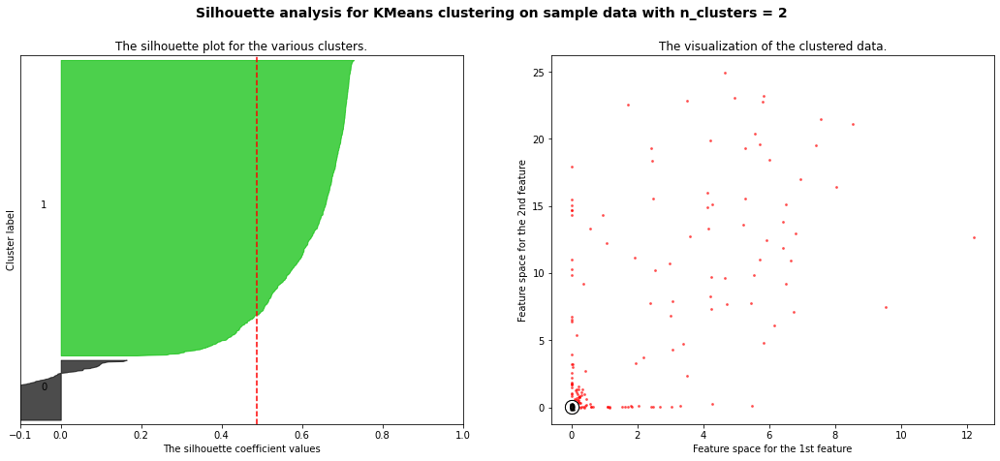

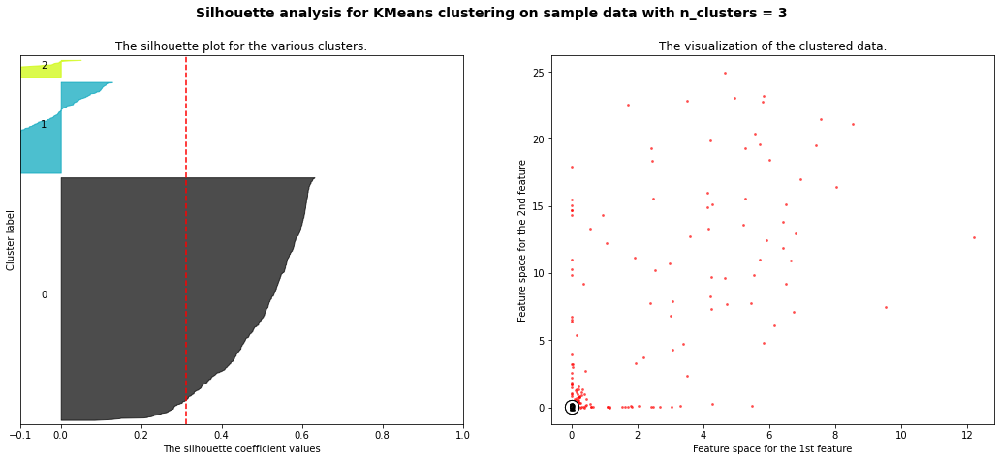

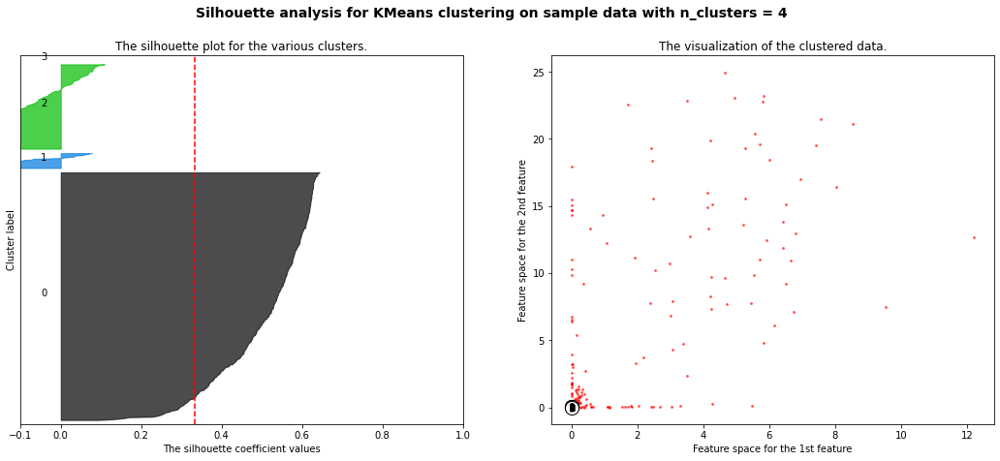

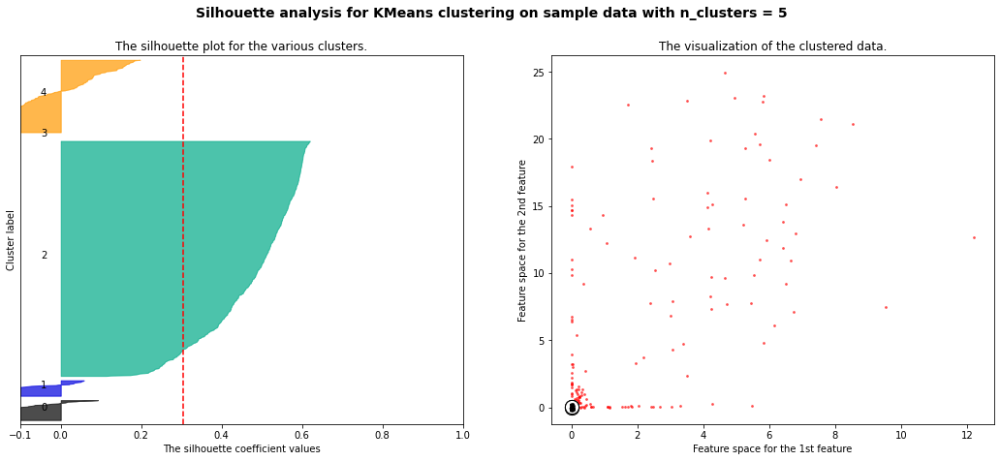

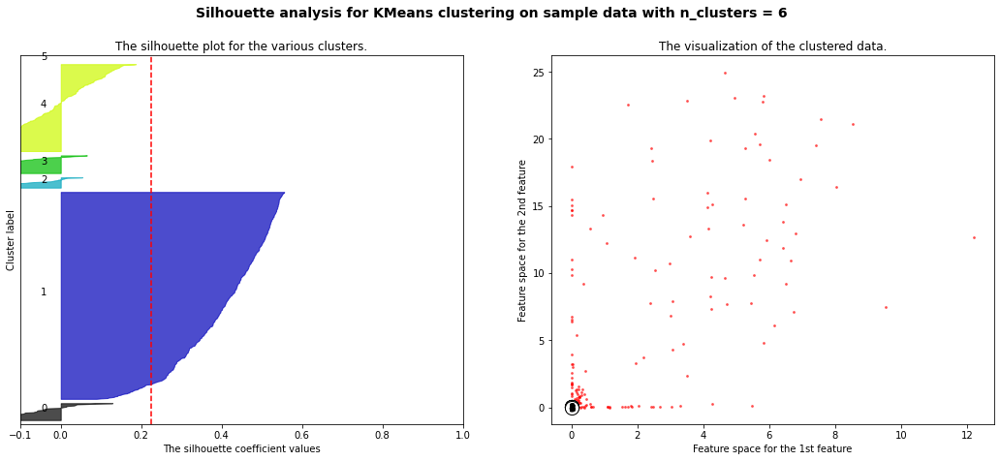

In [33]:
#example of performing the silhouette analysis
range_n_clusters = [2, 3, 4, 5, 6]

silhouette_for_clusters(range_n_clusters, all_fv, kmeans = True)

/Users/gabrielkrenzer/anaconda3/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/gabrielkrenzer/anaconda3/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


For n_clusters = 2 The average silhouette_score is : 0.5032044696630184
For n_clusters = 3 The average silhouette_score is : 0.3429744519833436


/Users/gabrielkrenzer/anaconda3/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/gabrielkrenzer/anaconda3/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


For n_clusters = 4 The average silhouette_score is : 0.3704801543771272
For n_clusters = 5 The average silhouette_score is : 0.3171154772488635


/Users/gabrielkrenzer/anaconda3/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


For n_clusters = 6 The average silhouette_score is : 0.3559024229292987


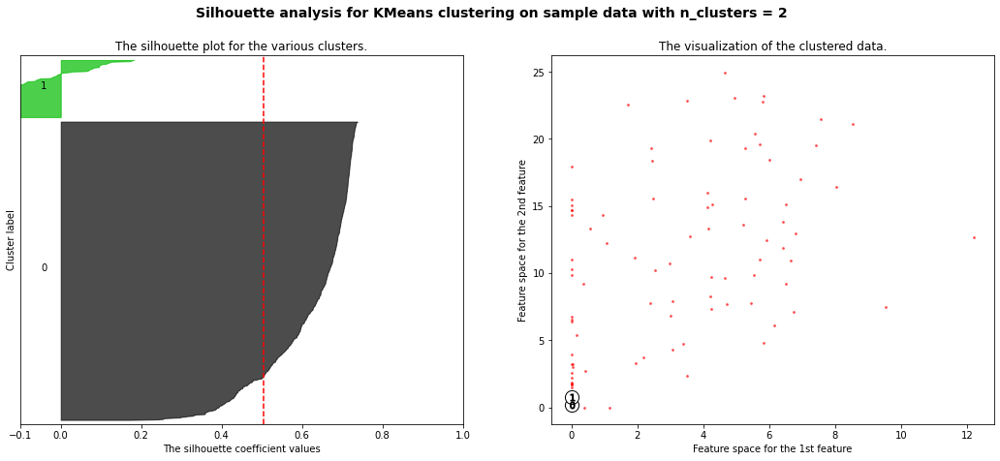

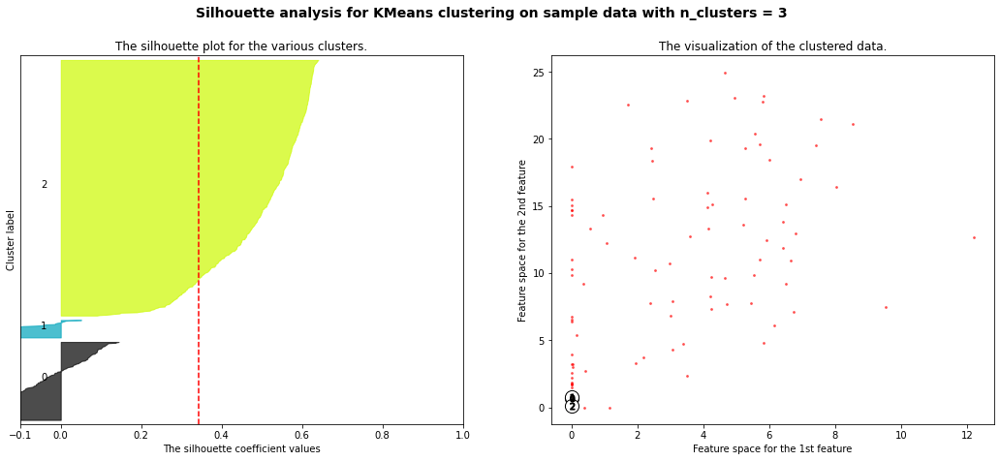

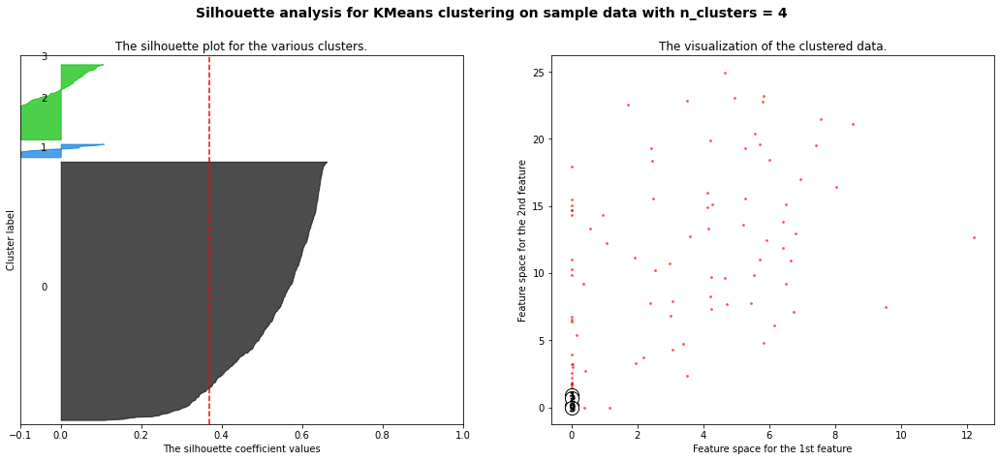

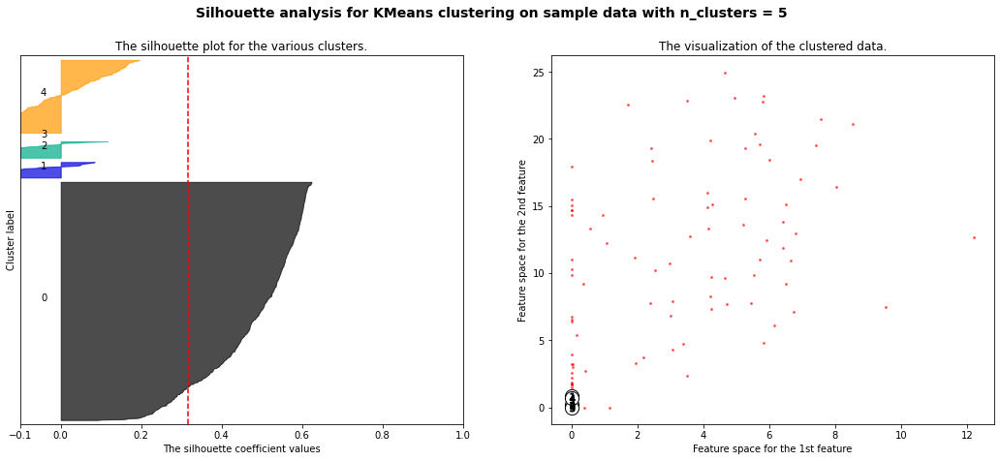

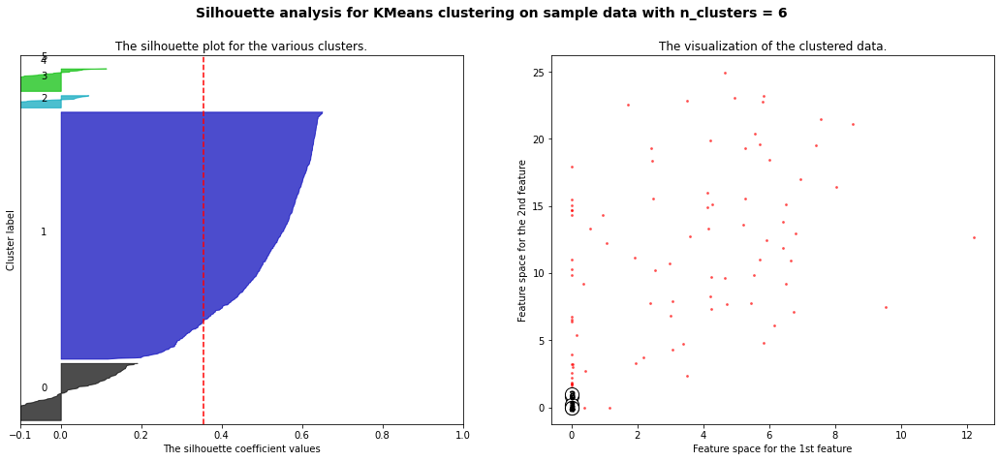

In [34]:
#example of performing the silhouette analysis
range_n_clusters = [2, 3, 4, 5, 6]

silhouette_for_clusters(range_n_clusters, tot_fv, kmeans = True)

/Users/gabrielkrenzer/anaconda3/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/gabrielkrenzer/anaconda3/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/gabrielkrenzer/anaconda3/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


For n_clusters = 2 The average silhouette_score is : 0.5011879516061983
For n_clusters = 3 The average silhouette_score is : 0.3994841974327332
For n_clusters = 4 The average silhouette_score is : 0.4014278491040666


/Users/gabrielkrenzer/anaconda3/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/gabrielkrenzer/anaconda3/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


For n_clusters = 5 The average silhouette_score is : 0.3808762326465544
For n_clusters = 6 The average silhouette_score is : 0.38728488589155685


/Users/gabrielkrenzer/anaconda3/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/gabrielkrenzer/anaconda3/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


For n_clusters = 7 The average silhouette_score is : 0.39144961113255267
For n_clusters = 8 The average silhouette_score is : 0.3843963909329742


/Users/gabrielkrenzer/anaconda3/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/gabrielkrenzer/anaconda3/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


For n_clusters = 9 The average silhouette_score is : 0.17665172763942447
For n_clusters = 10 The average silhouette_score is : 0.17531149620801295


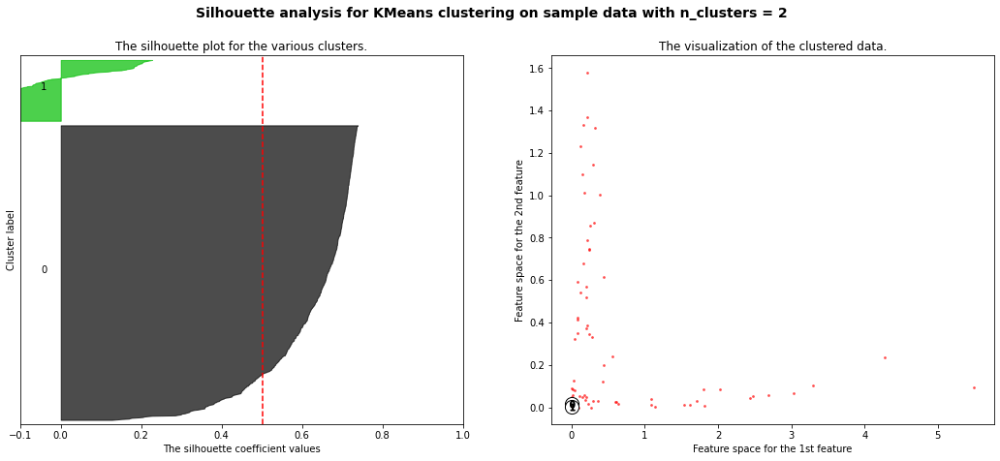

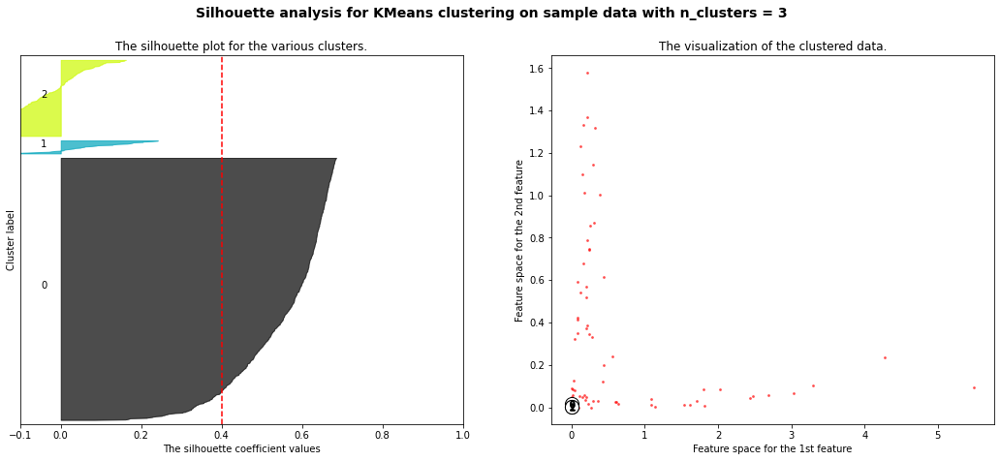

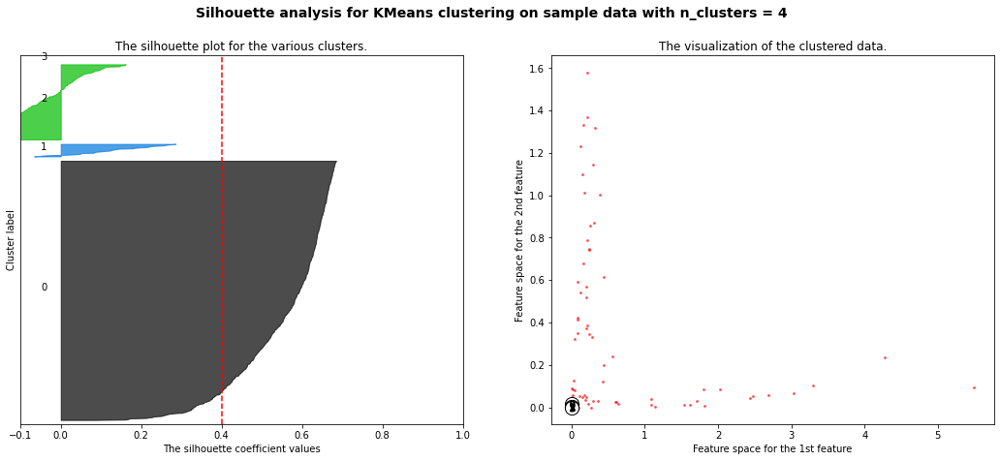

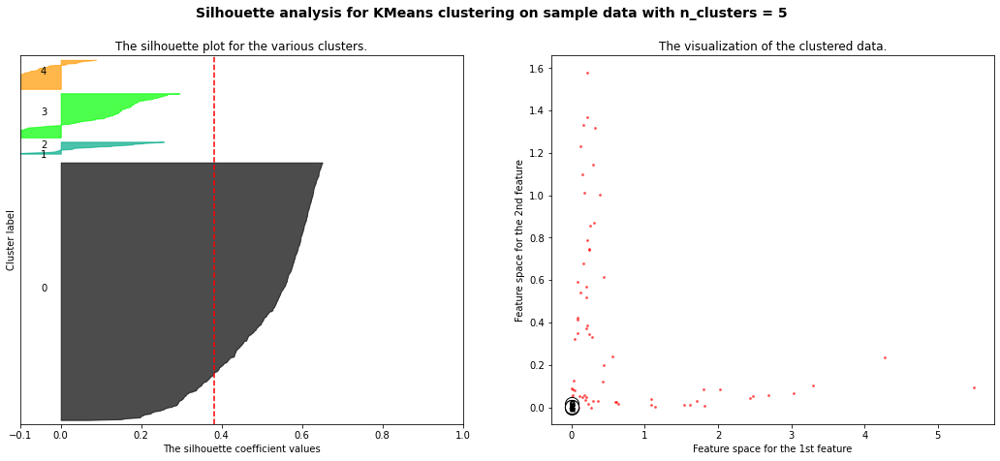

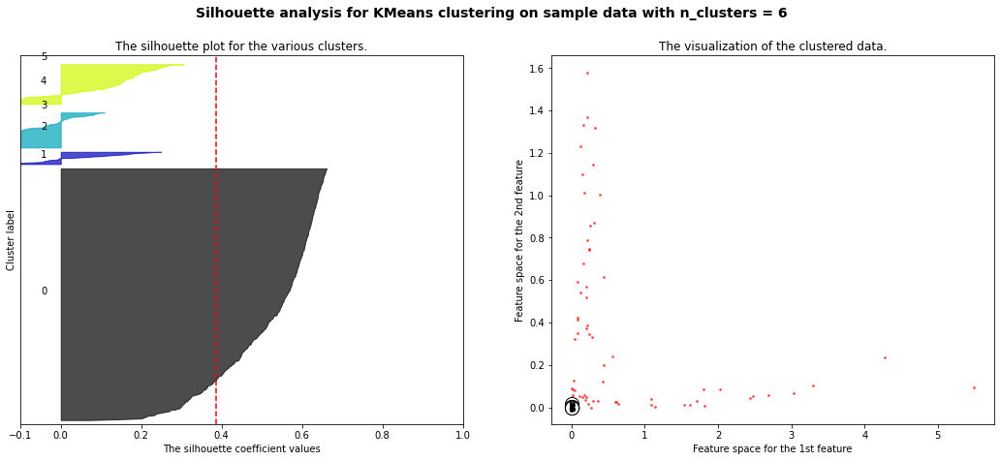

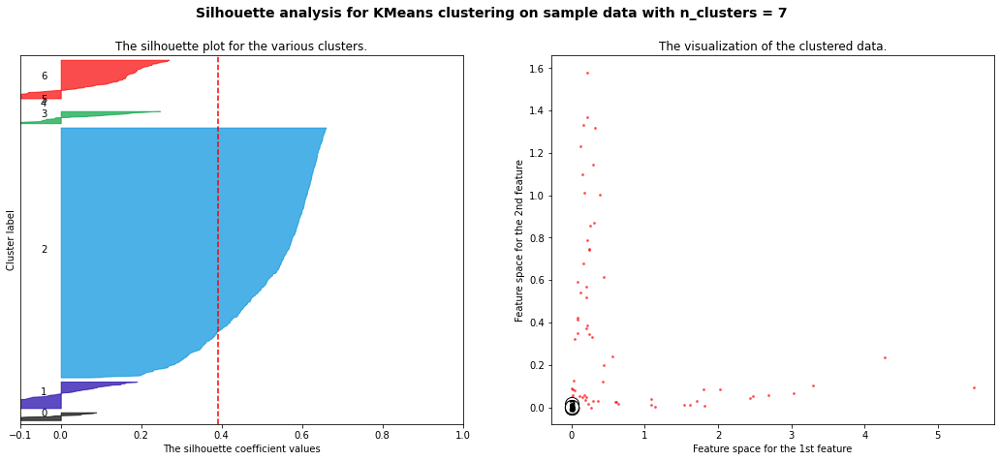

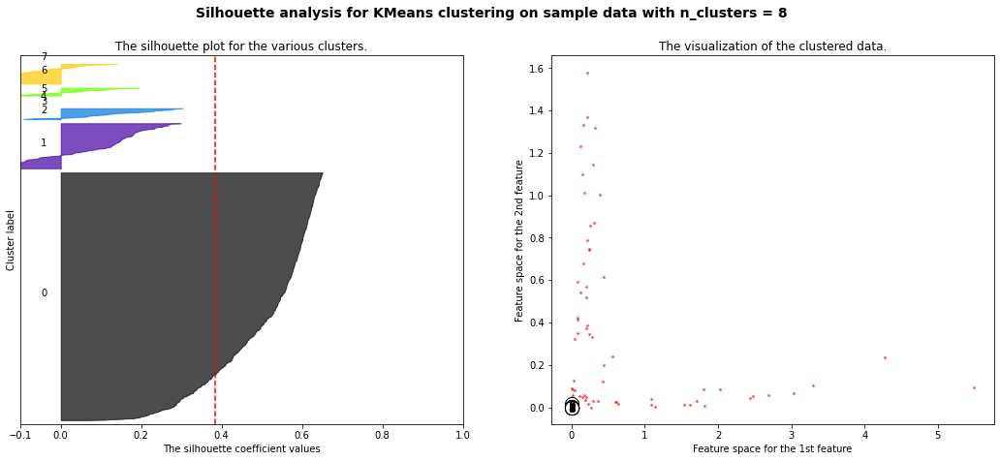

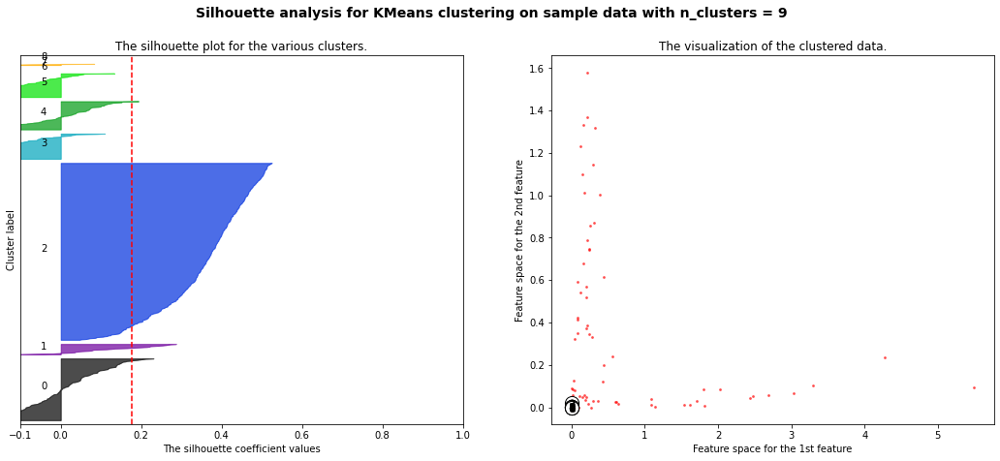

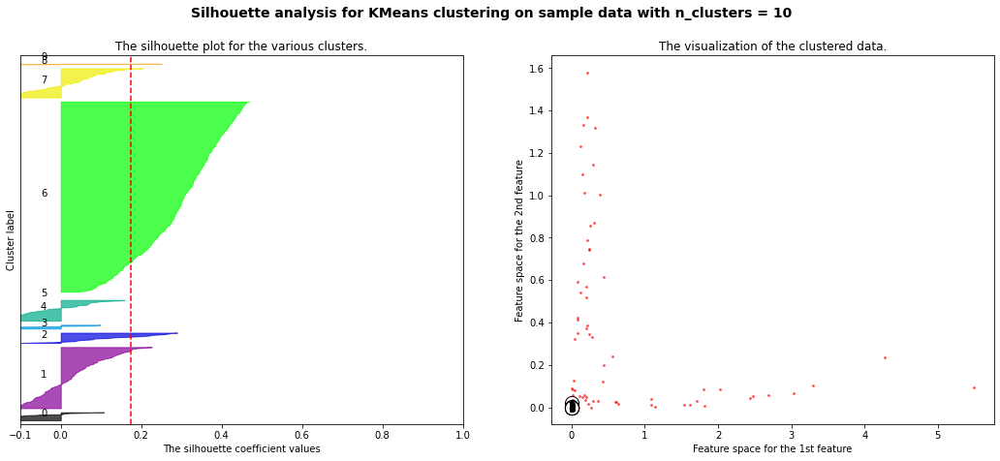

In [35]:
#example of performing the silhouette analysis
range_n_clusters = [2, 3, 4, 5, 6, 7, 8, 9, 10]

silhouette_for_clusters(range_n_clusters, li_fv, kmeans = True)

## Principal Component Analysis

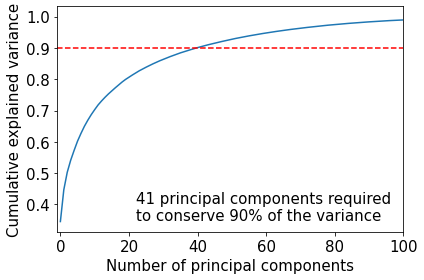

Number of components required to conserve 90% of the variance: 41


In [18]:
for fv in [tot_fv]:#[tot_fv, li_fv, all_fv]:
    pca = PCA().fit(fv)
    plt.plot(np.cumsum(pca.explained_variance_ratio_))
    plt.axhline(0.9, linestyle='--', color='r')
    plt.xlabel('Number of principal components', fontsize=fs)
    plt.ylabel('Cumulative explained variance', fontsize=fs)
    plt.xticks(fontsize=fs)
    plt.yticks(fontsize=fs)
    plt.xlim(-1, 100)
    pca = PCA(0.90).fit(fv)
    plt.annotate(str(pca.n_components_)+' principal components required\nto conserve 90% of the variance',
                 (22, 0.35), fontsize=fs)
    plt.tight_layout()
    plt.savefig('variance_pca.pdf')
    plt.show()
    print('Number of components required to conserve 90% of the variance: '+str(pca.n_components_))

So the number of components required to account for about 90% of the variance is 54 (total DOS), 35 (Li DOS), and 63 (both total and Li DOS). Now we now this, we can apply PCA to our feature vectors to project them into a reduced number of dimensions.

In [19]:
pca_tot_fv = PCA(41).fit_transform(tot_fv)
pca_li_fv = PCA(28).fit_transform(li_fv)
pca_all_fv = PCA(48).fit_transform(all_fv)

For n_clusters = 2 The average silhouette_score is : 0.526167264118062


/Users/gabrielkrenzer/anaconda3/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/gabrielkrenzer/anaconda3/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/gabrielkrenzer/anaconda3/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


For n_clusters = 3 The average silhouette_score is : 0.42862507222683016
For n_clusters = 4 The average silhouette_score is : 0.4245697403246746


/Users/gabrielkrenzer/anaconda3/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


For n_clusters = 5 The average silhouette_score is : 0.4162539501089791


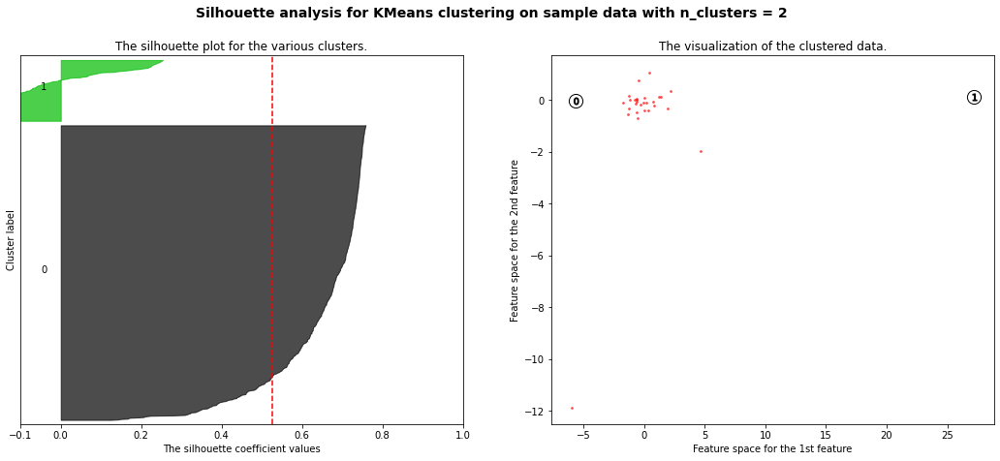

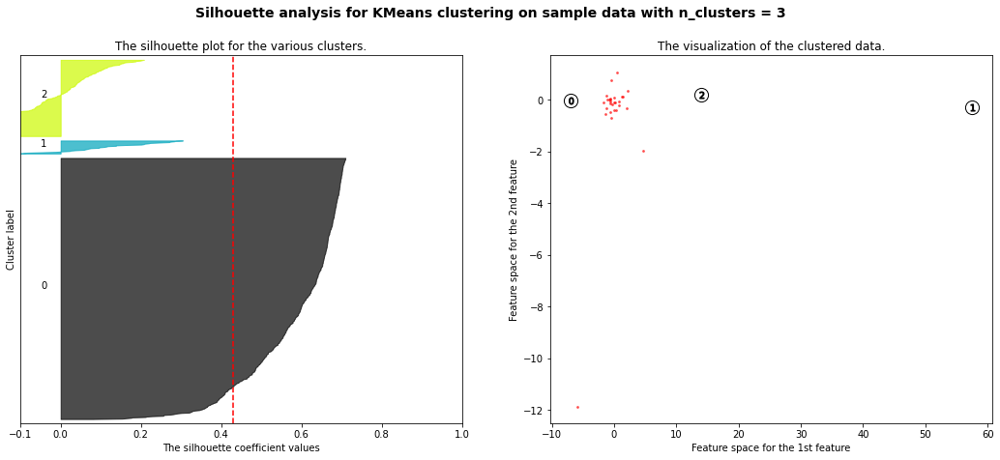

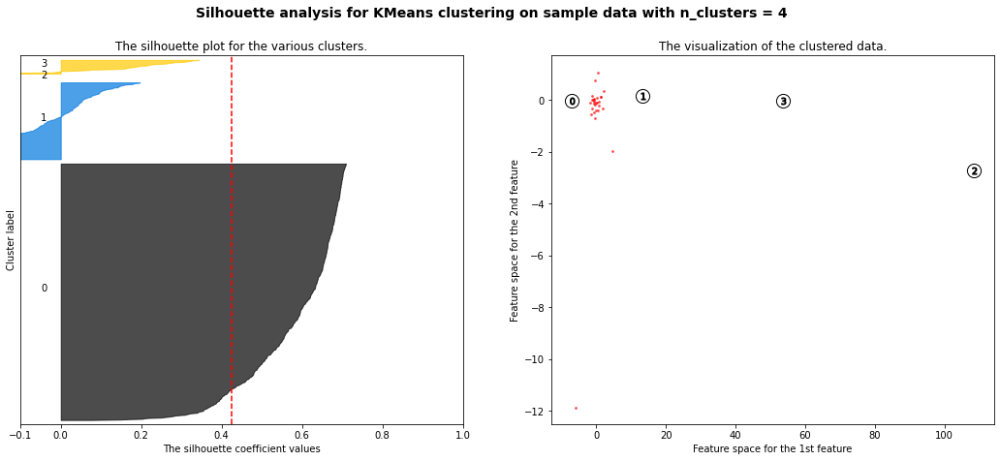

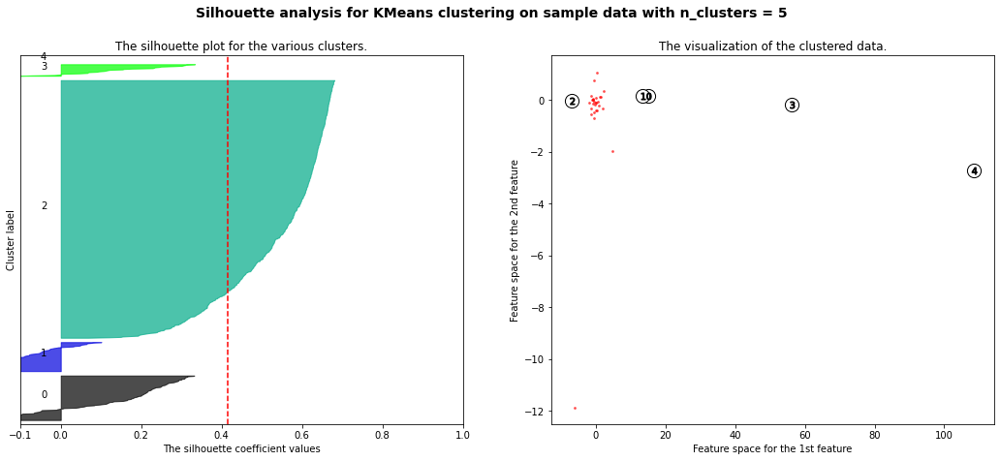

In [38]:
#example of performing the silhouette analysis
range_n_clusters = [2, 3, 4, 5]

silhouette_for_clusters(range_n_clusters, pca_li_fv, kmeans = True)

/Users/gabrielkrenzer/anaconda3/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/gabrielkrenzer/anaconda3/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/gabrielkrenzer/anaconda3/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


For n_clusters = 2 The average silhouette_score is : 0.52612553457996
For n_clusters = 3 The average silhouette_score is : 0.35259239949641924
For n_clusters = 4 The average silhouette_score is : 0.3946984752933595


/Users/gabrielkrenzer/anaconda3/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


For n_clusters = 5 The average silhouette_score is : 0.3442610863772075


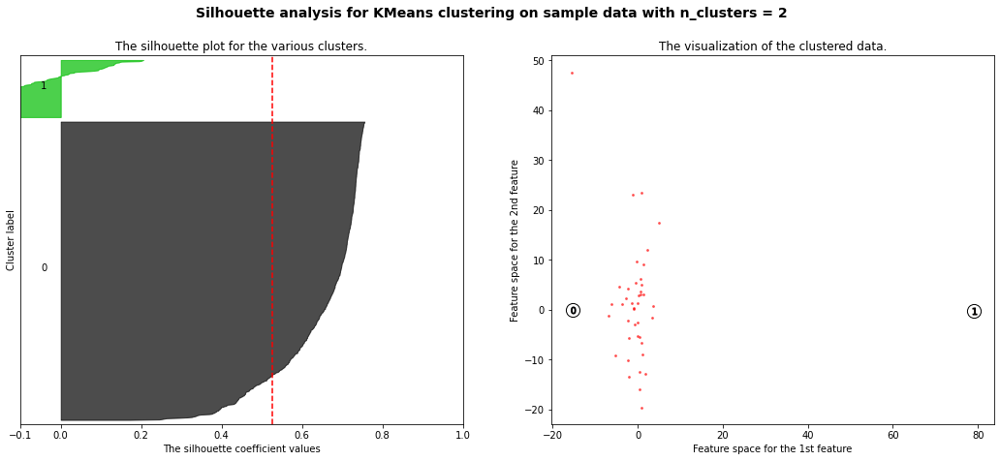

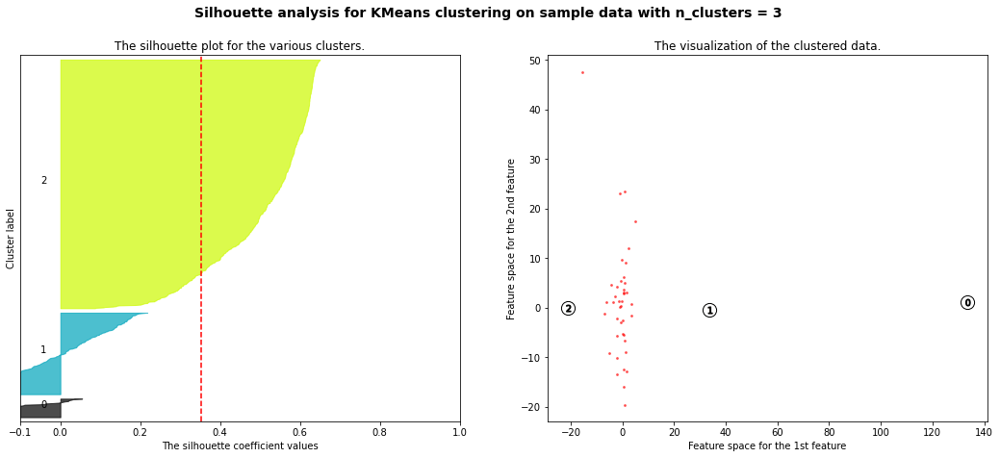

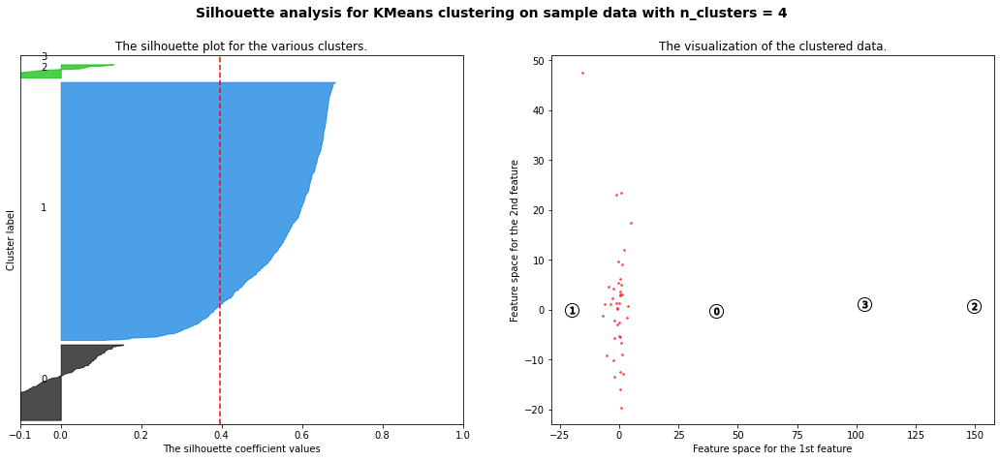

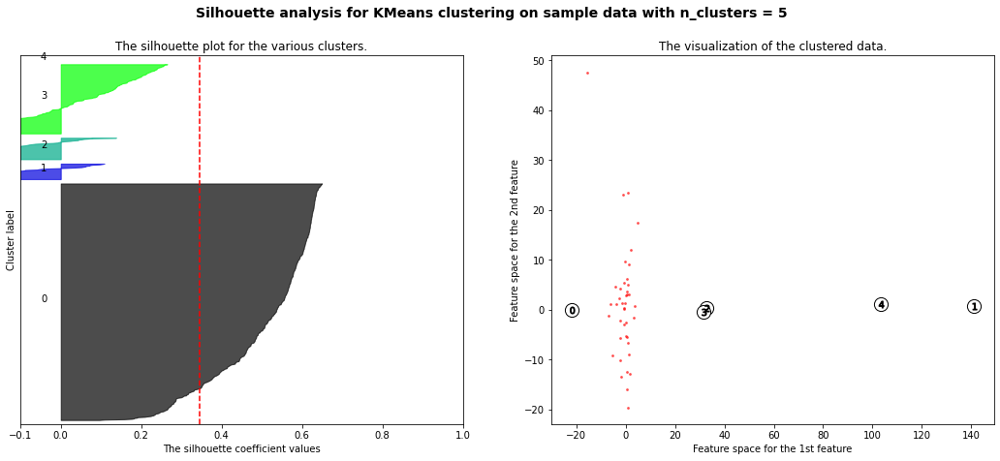

In [39]:
#example of performing the silhouette analysis
range_n_clusters = [2, 3, 4, 5]

silhouette_for_clusters(range_n_clusters, pca_tot_fv, kmeans = True)

/Users/gabrielkrenzer/anaconda3/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/gabrielkrenzer/anaconda3/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/gabrielkrenzer/anaconda3/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


For n_clusters = 2 The average silhouette_score is : 0.5112392938479953
For n_clusters = 3 The average silhouette_score is : 0.3373908969476881
For n_clusters = 4 The average silhouette_score is : 0.3605972554071926


/Users/gabrielkrenzer/anaconda3/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


For n_clusters = 5 The average silhouette_score is : 0.34493158339299135


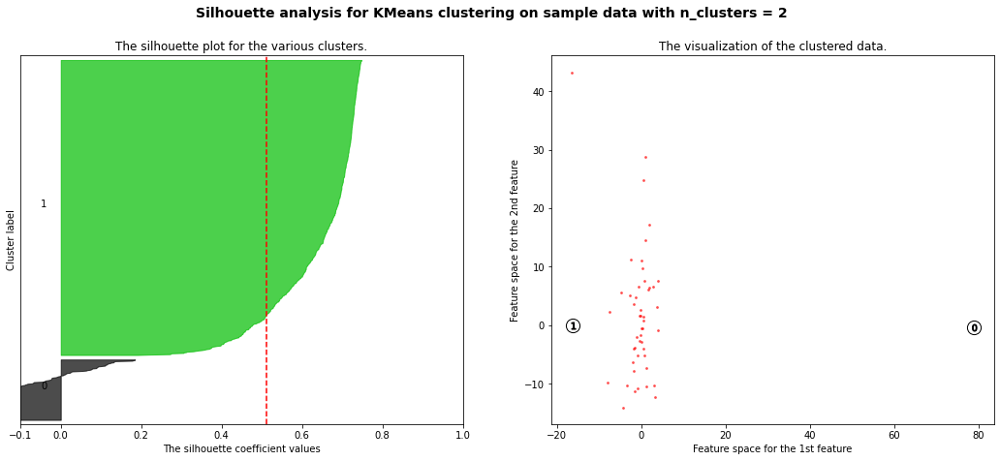

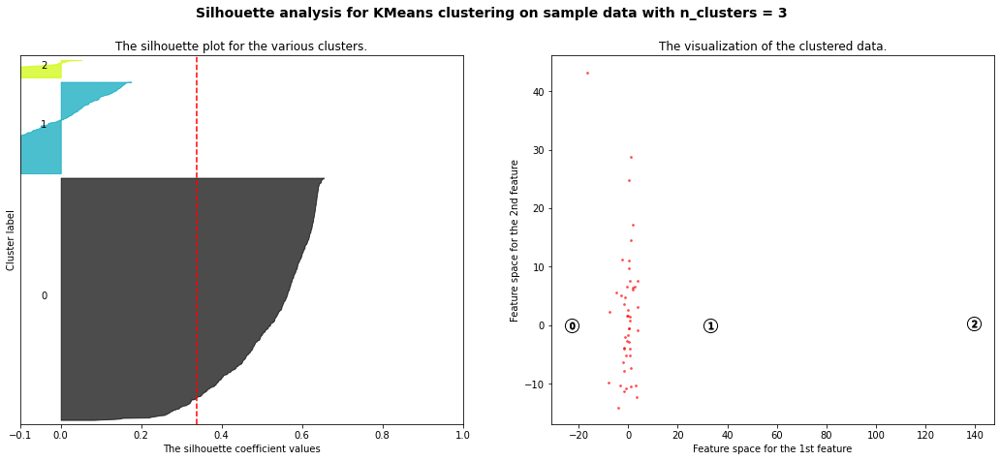

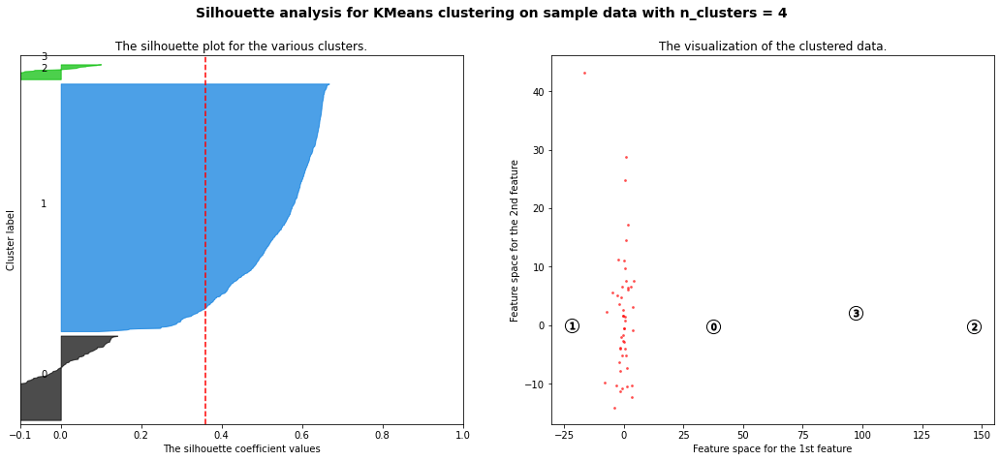

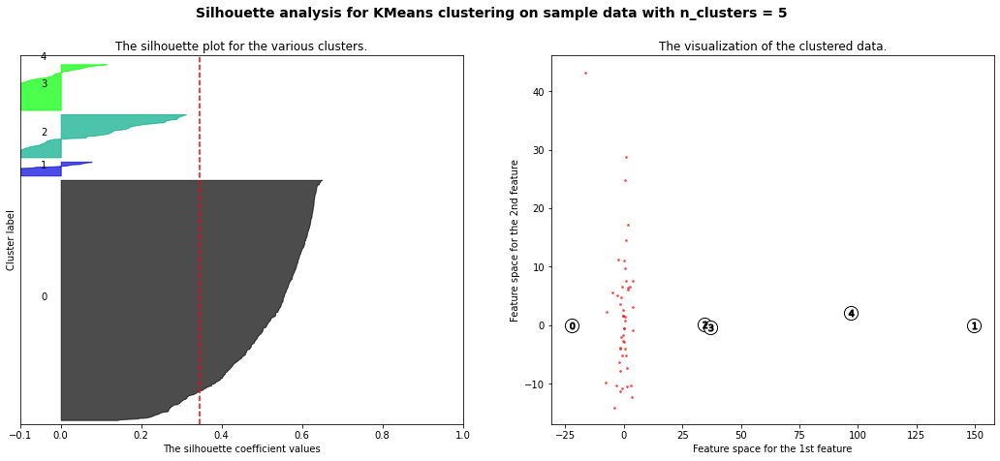

In [40]:
#example of performing the silhouette analysis
range_n_clusters = [2, 3, 4, 5]

silhouette_for_clusters(range_n_clusters, pca_all_fv, kmeans = True)

### Manifold Learning: Embedding For Dimensionality Reduction

#### t-Stochastic Neighbour Embedding 

In [20]:
tsne = TSNE(n_components=2, init='random', learning_rate='auto',random_state=0)

tsne_tot_fv = tsne.fit_transform(tot_fv)
tsne_li_fv = tsne.fit_transform(li_fv)
tsne_all_fv = tsne.fit_transform(all_fv)

#previously reducing the number of dimensions using PCA - noise reduction
pca_tsne_tot_fv = tsne.fit_transform(pca_tot_fv)
pca_tsne_li_fv = tsne.fit_transform(pca_li_fv)
pca_tsne_all_fv = tsne.fit_transform(pca_all_fv)

In [21]:
for fv in [tsne_li_fv, pca_tsne_li_fv]:

    #store feature vector into dataframe
    df = pd.DataFrame(fv, 
                      columns = ['Dimension 1','Dimension 2'])
    #add formulaes to be able to analyse later
    formulaes = []
    for i in [*range(0, s)]:
        formulaes.append(data.loc[i,'formula_pretty_reduced'])
    df['Formula'] = formulaes
    #add conductivity labels
    conductivity = []
    conductivity_verbose = []
    for i in [*range(0, s)]:
        conductivity.append(data.loc[i,'σ(RT)(S cm-1)'])
        if data.loc[i,'Conductor?'] == True:
            conductivity_verbose.append('Yes')
        elif data.loc[i,'Conductor?'] == False:
            conductivity_verbose.append('No')
        else:
            conductivity_verbose.append('Unknown')
    df['σ(RT)(S cm-1)'] = conductivity
    df['Conductor?'] = conductivity_verbose


    fig = px.scatter(df, x='Dimension 1', y='Dimension 2', 
                     color='Conductor?', hover_data=['σ(RT)(S cm-1)', 'Formula'],
                     color_discrete_sequence=['dodgerblue', 'limegreen', 'tomato'])

    fig.update_traces(marker=dict(size=6,
                                  line=dict(width=1,
                                            color='DarkSlateGrey')),
                      selector=dict(mode='markers'))

    #fig.write_html('clustering.html')
    fig.show()

In [22]:
for fv in [tsne_tot_fv, pca_tsne_tot_fv]:
    #store feature vector into dataframe
    df = pd.DataFrame(fv, 
                      columns = ['Dimension 1','Dimension 2'])
    #add formulaes to be able to analyse later
    formulaes = []
    mat_id = []
    for i in [*range(0, s)]:
        formulaes.append(data.loc[i,'formula_pretty_reduced'])
        mat_id.append(data.loc[i,'material_id'])
    df['Formula'] = formulaes
    df['material_id'] = mat_id
    #add conductivity labels
    conductivity = []
    conductivity_verbose = []
    for i in [*range(0, s)]:
        conductivity.append(data.loc[i,'σ(RT)(S cm-1)'])
        if data.loc[i,'Conductor?'] == True:
            conductivity_verbose.append('Yes')
        elif data.loc[i,'Conductor?'] == False:
            conductivity_verbose.append('No')
        else:
            conductivity_verbose.append('Unknown')
    df['σ(RT)(S cm-1)'] = conductivity
    df['Conductor?'] = conductivity_verbose


    fig = px.scatter(df, x='Dimension 1', y='Dimension 2', 
                     color='Conductor?', hover_data=['σ(RT)(S cm-1)', 'Formula'],
                     color_discrete_sequence=['dodgerblue', 'limegreen', 'tomato'])

    fig.update_traces(marker=dict(size=6,
                                  line=dict(width=1,
                                            color='DarkSlateGrey')),
                      selector=dict(mode='markers'))


    #fig.write_html('clustering.html')
    fig.show()

In [23]:
fv = tsne_tot_fv
#store feature vector into dataframe
df = pd.DataFrame(fv, 
                  columns = ['Dimension 1','Dimension 2'])
#add formulaes to be able to analyse later
formulaes = []
mat_id = []
for i in [*range(0, s)]:
    formulaes.append(data.loc[i,'formula_pretty_reduced'])
    mat_id.append(data.loc[i,'material_id'])
df['Formula'] = formulaes
df['material_id'] = mat_id
#add conductivity labels
conductivity = []
conductivity_verbose = []
for i in [*range(0, s)]:
    conductivity.append(data.loc[i,'σ(RT)(S cm-1)'])
    if data.loc[i,'Conductor?'] == True:
        conductivity_verbose.append('Yes')
    elif data.loc[i,'Conductor?'] == False:
        conductivity_verbose.append('No')
    else:
        conductivity_verbose.append('Unknown')
df['σ(RT)(S cm-1)'] = conductivity
df['Conductor?'] = conductivity_verbose


fig = px.scatter(df, x='Dimension 1', y='Dimension 2', 
                 color='Conductor?', hover_data=['σ(RT)(S cm-1)', 'Formula'],
                 color_discrete_sequence=['dodgerblue', 'limegreen', 'tomato'])

fig.update_traces(marker=dict(size=6,
                              line=dict(width=1,
                                        color='DarkSlateGrey')),
                  selector=dict(mode='markers'))

fig.write_image('full_dos_2dim_best.pdf')
#fig.write_html('clustering.html')
fig.show()

In [24]:
fv = tsne_tot_fv
#store feature vector into dataframe
df = pd.DataFrame(fv, 
                  columns = ['Dimension 1','Dimension 2'])
#add formulaes to be able to analyse later
formulaes = []
formulaes = []
mat_id = []
for i in [*range(0, s)]:
    formulaes.append(data.loc[i,'formula_pretty_reduced'])
    mat_id.append(data.loc[i,'material_id'])
df['Formula'] = formulaes
df['material_id'] = mat_id
#add conductivity labels
conductivity = []
conductivity_verbose = []
for i in [*range(0, s)]:
    conductivity.append(data.loc[i,'σ(RT)(S cm-1)'])
    if data.loc[i,'Conductor?'] == True:
        conductivity_verbose.append('Yes')
    elif data.loc[i,'Conductor?'] == False:
        conductivity_verbose.append('No')
    else:
        conductivity_verbose.append('Unknown')
df['σ(RT)(S cm-1)'] = conductivity
df['Conductor?'] = conductivity_verbose

df

,Dimension 1,Dimension 2,Formula,material_id,σ(RT)(S cm-1),Conductor?
0,-2.992570,-0.774803,LiInF4,mp-8892,NaN,Unknown
1,19.530729,-3.483487,LiTlPHO3,mp-772968,NaN,Unknown
2,12.159399,5.545249,LiSbO3,mp-756951,NaN,Unknown
3,-2.345729,-12.270494,Li7Y7ZrS16,mp-754856,NaN,Unknown
4,18.166838,6.083326,LiP(HO2)2,mp-24610,NaN,Unknown
...,...,...,...,...,...,...
862,24.602028,-14.675485,LiZnSb,mp-9919,NaN,Unknown
863,-19.425207,18.738972,Li6Y(BO3)3,mp-14704,NaN,Unknown
864,-9.376622,20.653355,Li4Zn(PO4)2,mp-557756,NaN,Unknown
865,-10.727131,6.858468,LiCaBO3,mp-966801,NaN,Unknown


In [25]:
for i in range(0, len(df)):
    x = df.at[i, 'Dimension 1']
    y = df.at[i, 'Dimension 2']
    if y>=-0.256*x-2.5:
        df.drop(index=i, inplace=True)
        
df

,Dimension 1,Dimension 2,Formula,material_id,σ(RT)(S cm-1),Conductor?
3,-2.345729,-12.270494,Li7Y7ZrS16,mp-754856,NaN,Unknown
12,24.065096,-10.606493,Li3ClO,mp-985585,0.00085,Yes
13,26.118307,-14.921390,LiI,mp-568273,NaN,Unknown
15,-16.329311,0.479423,Na2LiAlP2,mp-9719,NaN,Unknown
16,-4.692349,-11.177969,Li3BiS4,mp-766422,NaN,Unknown
...,...,...,...,...,...,...
844,17.573832,-7.902424,Na2LiAlH6,mp-24413,NaN,Unknown
850,16.600992,-15.823168,LiAlSe2,mp-7117,NaN,Unknown
858,13.394849,-16.372046,RbLiO,mp-28545,NaN,Unknown
860,-0.783547,-5.924016,LiHS,mp-30959,NaN,Unknown


In [31]:
for i in range(0, len(df)):
    x = df.at[i, 'Dimension 1']
    y = df.at[i, 'Dimension 2']
    r = 5
    xc = 25
    yc = -10
    d = (x-xc)**2+(y-yc)**2
    if d>r**2:
        df.drop(index=i, inplace=True)

print(len(df))
df.to_csv('circle_dos_fv.csv')
df

49


,Dimension 1,Dimension 2,Formula,material_id,σ(RT)(S cm-1),Conductor?
5,24.964655,-7.887603,Li3N,mp-2341,NaN,Unknown
12,24.065096,-10.606493,Li3ClO,mp-985585,0.000850,Yes
18,24.509417,-8.401900,Li2CN2,mp-9610,NaN,Unknown
20,23.891123,-6.653459,Li2PdO2,mp-7608,NaN,Unknown
48,24.543882,-9.474545,Li3H3N2,mp-977164,NaN,Unknown
49,25.399204,-11.750598,LiCoS2,mp-753946,NaN,Unknown
57,24.641640,-11.536170,LiBH4,mp-644223,NaN,Unknown
61,28.587194,-9.177866,LiBeSb,mp-9575,NaN,Unknown
70,23.155861,-8.094121,LiC,mp-1378,NaN,Unknown
76,23.286158,-8.915476,Li3P,mp-736,0.000703,Yes


Best clustering here with t-sne on the full vector.

In [50]:
for fv in [tsne_all_fv, pca_tsne_all_fv]:
    #store feature vector into dataframe
    df = pd.DataFrame(fv, 
                      columns = ['Dimension 1','Dimension 2'])
    #add formulaes to be able to analyse later
    formulaes = []
    for i in [*range(0, s)]:
        formulaes.append(data.loc[i,'formula_pretty_reduced'])
    df['Formula'] = formulaes
    #add conductivity labels
    conductivity = []
    conductivity_verbose = []
    for i in [*range(0, s)]:
        conductivity.append(data.loc[i,'σ(RT)(S cm-1)'])
        if data.loc[i,'Conductor?'] == True:
            conductivity_verbose.append('Yes')
        elif data.loc[i,'Conductor?'] == False:
            conductivity_verbose.append('No')
        else:
            conductivity_verbose.append('Unknown')
    df['σ(RT)(S cm-1)'] = conductivity
    df['Conductor?'] = conductivity_verbose


    fig = px.scatter(df, x='Dimension 1', y='Dimension 2', 
                     color='Conductor?', hover_data=['σ(RT)(S cm-1)', 'Formula'],
                     color_discrete_sequence=['dodgerblue', 'limegreen', 'tomato'])

    fig.update_traces(marker=dict(size=6,
                                  line=dict(width=1,
                                            color='DarkSlateGrey')),
                      selector=dict(mode='markers'))

    #fig.write_html('clustering.html')
    fig.show()

#### Isomap

In [51]:
isomap = Isomap(n_components=2)

im_tot_fv = isomap.fit_transform(tot_fv)
im_li_fv = isomap.fit_transform(li_fv)
im_all_fv = isomap.fit_transform(all_fv)

#previously reducing the number of dimensions using PCA - noise reduction
pca_im_tot_fv = isomap.fit_transform(pca_tot_fv)
pca_im_li_fv = isomap.fit_transform(pca_li_fv)
pca_im_all_fv = isomap.fit_transform(pca_all_fv)

Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7f72fc498a60>
Traceback (most recent call last):
  File "/home/gkrenzer/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/home/gkrenzer/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
  File "/home/gkrenzer/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
  File "/home/gkrenzer/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 646, in get_version
    config = get_config().split()
AttributeError: 'NoneType' object has no attribute 'split'
Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<loc

In [52]:
for fv in [im_li_fv, pca_im_li_fv]:
    #store feature vector into dataframe
    df = pd.DataFrame(fv, 
                      columns = ['Dimension 1','Dimension 2'])
    #add formulaes to be able to analyse later
    formulaes = []
    for i in [*range(0, s)]:
        formulaes.append(data.loc[i,'formula_pretty_reduced'])
    df['Formula'] = formulaes
    #add conductivity labels
    conductivity = []
    conductivity_verbose = []
    for i in [*range(0, s)]:
        conductivity.append(data.loc[i,'σ(RT)(S cm-1)'])
        if data.loc[i,'Conductor?'] == True:
            conductivity_verbose.append('Yes')
        elif data.loc[i,'Conductor?'] == False:
            conductivity_verbose.append('No')
        else:
            conductivity_verbose.append('Unknown')
    df['σ(RT)(S cm-1)'] = conductivity
    df['Conductor?'] = conductivity_verbose


    fig = px.scatter(df, x='Dimension 1', y='Dimension 2', 
                     color='Conductor?', hover_data=['σ(RT)(S cm-1)', 'Formula'],
                     color_discrete_sequence=['dodgerblue', 'limegreen', 'tomato'])

    fig.update_traces(marker=dict(size=6,
                                  line=dict(width=1,
                                            color='DarkSlateGrey')),
                      selector=dict(mode='markers'))

    #fig.write_html('clustering.html')
    fig.show()

In [53]:
for fv in [im_tot_fv, pca_im_tot_fv]:
    #store feature vector into dataframe
    df = pd.DataFrame(fv, 
                      columns = ['Dimension 1','Dimension 2'])
    #add formulaes to be able to analyse later
    formulaes = []
    for i in [*range(0, s)]:
        formulaes.append(data.loc[i,'formula_pretty_reduced'])
    df['Formula'] = formulaes
    #add conductivity labels
    conductivity = []
    conductivity_verbose = []
    for i in [*range(0, s)]:
        conductivity.append(data.loc[i,'σ(RT)(S cm-1)'])
        if data.loc[i,'Conductor?'] == True:
            conductivity_verbose.append('Yes')
        elif data.loc[i,'Conductor?'] == False:
            conductivity_verbose.append('No')
        else:
            conductivity_verbose.append('Unknown')
    df['σ(RT)(S cm-1)'] = conductivity
    df['Conductor?'] = conductivity_verbose


    fig = px.scatter(df, x='Dimension 1', y='Dimension 2', 
                     color='Conductor?', hover_data=['σ(RT)(S cm-1)', 'Formula'],
                     color_discrete_sequence=['dodgerblue', 'limegreen', 'tomato'])

    fig.update_traces(marker=dict(size=6,
                                  line=dict(width=1,
                                            color='DarkSlateGrey')),
                      selector=dict(mode='markers'))

    #fig.write_html('clustering.html')
    fig.show()

In [54]:
for fv in [im_all_fv, pca_im_all_fv]:
    #store feature vector into dataframe
    df = pd.DataFrame(fv, 
                      columns = ['Dimension 1','Dimension 2'])
    #add formulaes to be able to analyse later
    formulaes = []
    for i in [*range(0, s)]:
        formulaes.append(data.loc[i,'formula_pretty_reduced'])
    df['Formula'] = formulaes
    #add conductivity labels
    conductivity = []
    conductivity_verbose = []
    for i in [*range(0, s)]:
        conductivity.append(data.loc[i,'σ(RT)(S cm-1)'])
        if data.loc[i,'Conductor?'] == True:
            conductivity_verbose.append('Yes')
        elif data.loc[i,'Conductor?'] == False:
            conductivity_verbose.append('No')
        else:
            conductivity_verbose.append('Unknown')
    df['σ(RT)(S cm-1)'] = conductivity
    df['Conductor?'] = conductivity_verbose


    fig = px.scatter(df, x='Dimension 1', y='Dimension 2', 
                     color='Conductor?', hover_data=['σ(RT)(S cm-1)', 'Formula'],
                     color_discrete_sequence=['dodgerblue', 'limegreen', 'tomato'])

    fig.update_traces(marker=dict(size=6,
                                  line=dict(width=1,
                                            color='DarkSlateGrey')),
                      selector=dict(mode='markers'))

    #fig.write_html('clustering.html')
    fig.show()

No clustering using isomaps.

### Adding other descriptors to feature vector

In [55]:
scaler = StandardScaler()

In [56]:
#using 0K phonon band centres
i = 0
for d in [fav, fav_tot, d_fav, first_peak_02, first_peak_05, rel_s_05]:
    if i == 0:
        fv_li_0 = np.append(li_fv, d, axis=1)
        fv_tot_0 = np.append(tot_fv, d, axis=1)
        fv_all_0 = np.append(all_fv, d, axis=1)
    else:
        fv_li_0 = np.append(fv_li_0, d, axis=1)
        fv_tot_0 = np.append(fv_tot_0, d, axis=1)
        fv_all_0 = np.append(fv_all_0, d, axis=1)
    i = i+1
fv_li_0 = scaler.fit_transform(fv_li_0)
fv_tot_0 = scaler.fit_transform(fv_tot_0)
fv_all_0 = scaler.fit_transform(fv_all_0)

#using room temperature phonon band centres
i = 0
for d in [fav_RT, fav_RTot, d_fav, first_peak_02, first_peak_05, rel_s_05]:
    if i == 0:
        fv_li_rt = np.append(li_fv, d, axis=1)
        fv_tot_rt = np.append(tot_fv, d, axis=1)
        fv_all_rt = np.append(all_fv, d, axis=1)
    else:
        fv_li_rt = np.append(fv_li_rt, d, axis=1)
        fv_tot_rt = np.append(fv_tot_rt, d, axis=1)
        fv_all_rt = np.append(fv_all_rt, d, axis=1)
    i = i+1
fv_li_rt = scaler.fit_transform(fv_li_rt)
fv_tot_rt = scaler.fit_transform(fv_tot_rt)
fv_all_rt = scaler.fit_transform(fv_all_rt)
    
#using both phonon band centres
i = 0
for d in [fav, fav_tot, fav_RT, fav_RTot, d_fav, first_peak_02, first_peak_05, rel_s_05]:
    if i == 0:
        fv_li_rt0 = np.append(li_fv, d, axis=1)
        fv_tot_rt0 = np.append(tot_fv, d, axis=1)
        fv_all_rt0 = np.append(all_fv, d, axis=1)
    else:
        fv_li_rt0 = np.append(fv_li_rt0, d, axis=1)
        fv_tot_rt0 = np.append(fv_tot_rt0, d, axis=1)
        fv_all_rt0 = np.append(fv_all_rt0, d, axis=1)
    i = i+1
fv_li_rt0 = scaler.fit_transform(fv_li_rt0)
fv_tot_rt0 = scaler.fit_transform(fv_tot_rt0)
fv_all_rt0 = scaler.fit_transform(fv_all_rt0)
    
#using best performing descritpors
i = 0
for d in [d_fav, first_peak_02, first_peak_05]:
    if i == 0:
        fv_li_best = np.append(li_fv, d, axis=1)
        fv_tot_best = np.append(tot_fv, d, axis=1)
        fv_all_best = np.append(all_fv, d, axis=1)
    else:
        fv_li_best = np.append(fv_li_best, d, axis=1)
        fv_tot_best = np.append(fv_tot_best, d, axis=1)
        fv_all_best = np.append(fv_all_best, d, axis=1)
    i = i+1
fv_li_best = scaler.fit_transform(fv_li_best)
fv_tot_best = scaler.fit_transform(fv_tot_best)
fv_all_best = scaler.fit_transform(fv_all_best)

#### Principal Component Analysis

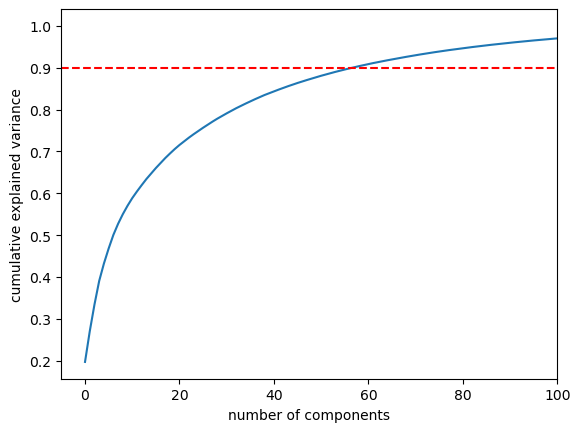

Number of components required to conserve 90% of the variance: 58


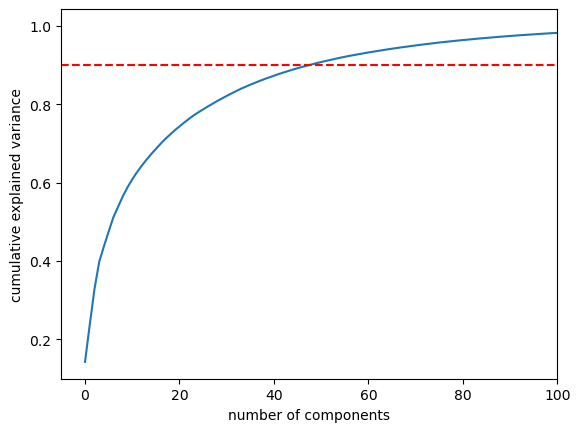

Number of components required to conserve 90% of the variance: 49


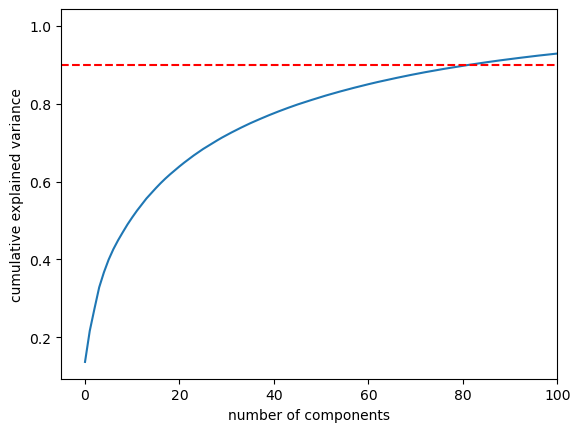

Number of components required to conserve 90% of the variance: 83


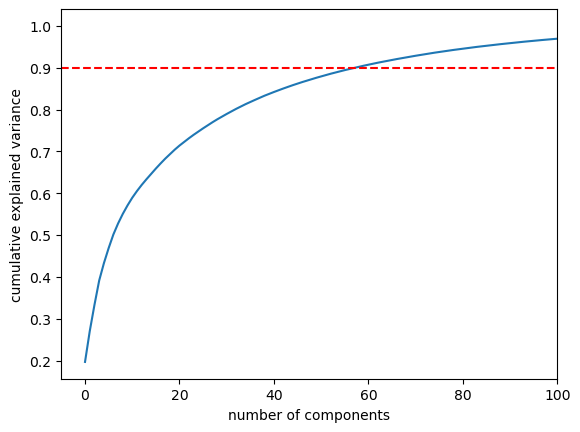

Number of components required to conserve 90% of the variance: 59


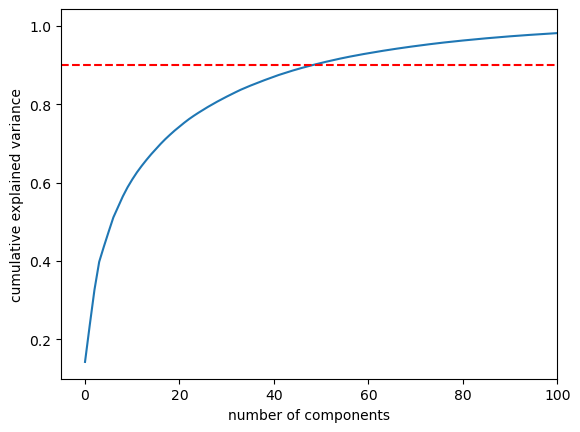

Number of components required to conserve 90% of the variance: 50


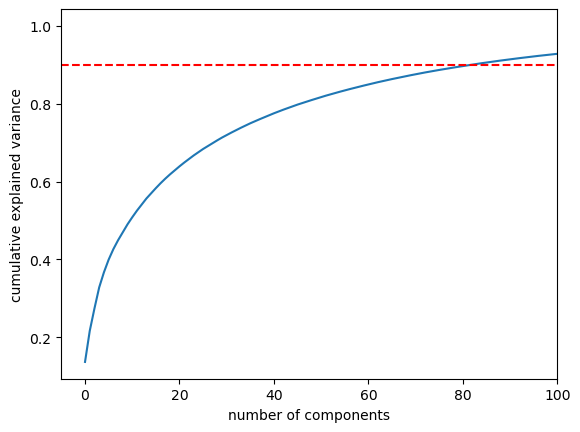

Number of components required to conserve 90% of the variance: 83


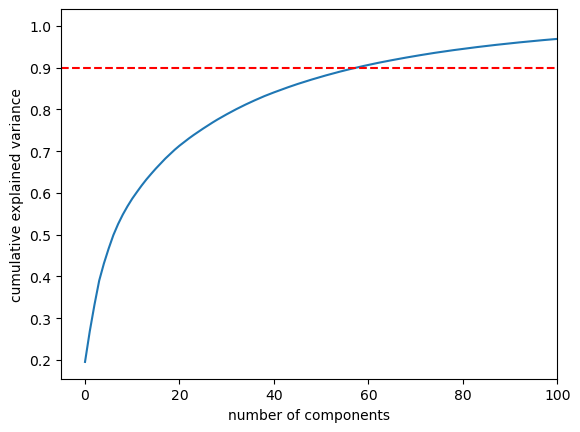

Number of components required to conserve 90% of the variance: 59


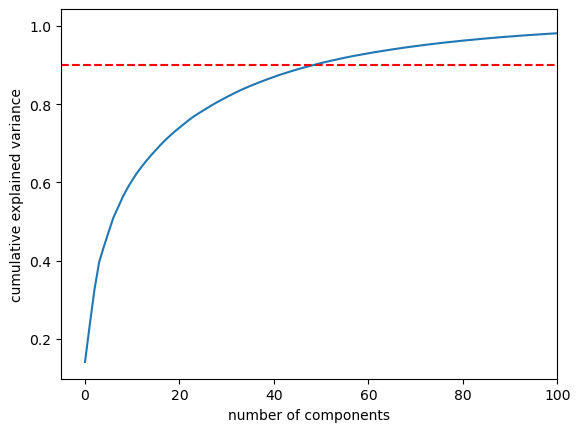

Number of components required to conserve 90% of the variance: 50


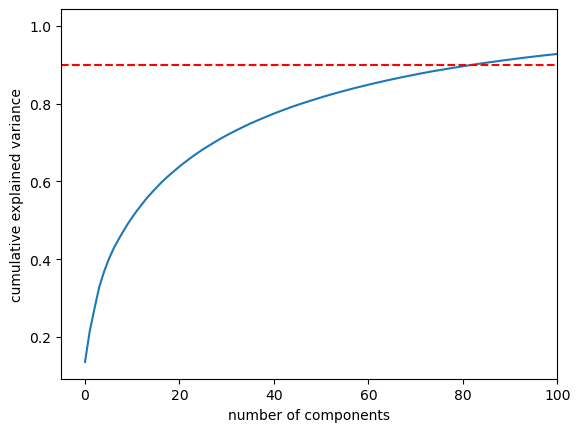

Number of components required to conserve 90% of the variance: 83


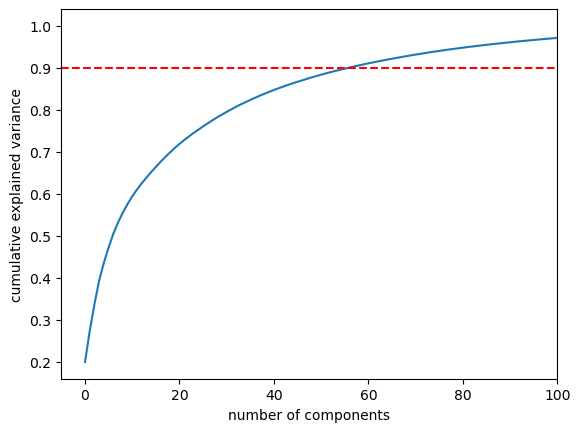

Number of components required to conserve 90% of the variance: 57


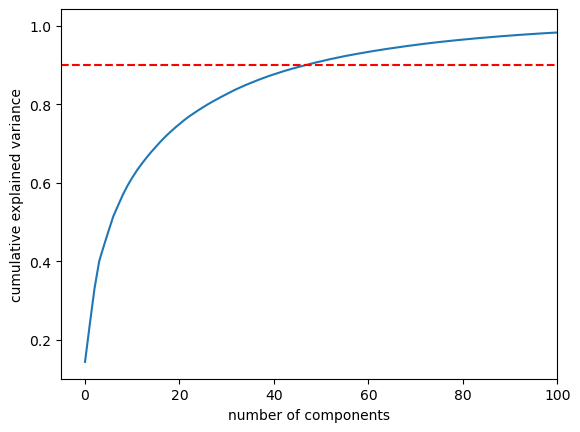

Number of components required to conserve 90% of the variance: 48


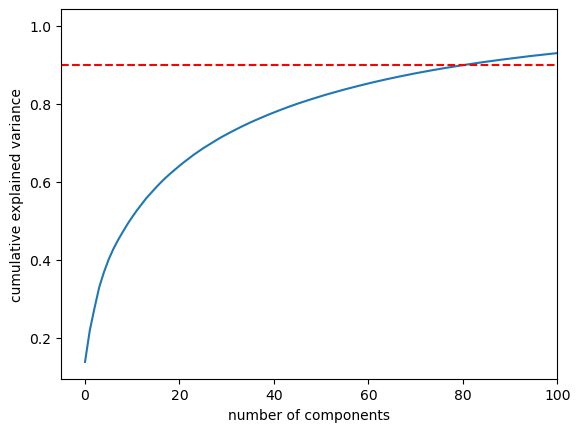

Number of components required to conserve 90% of the variance: 82


In [57]:
for fv in [fv_tot_0, fv_li_0, fv_all_0,
           fv_tot_rt, fv_li_rt, fv_all_rt,
           fv_tot_rt0, fv_li_rt0, fv_all_rt0,
           fv_tot_best, fv_li_best, fv_all_best]:
    pca = PCA().fit(fv)
    plt.plot(np.cumsum(pca.explained_variance_ratio_))
    plt.axhline(0.9, linestyle='--', color='r')
    plt.xlabel('number of components')
    plt.ylabel('cumulative explained variance')
    plt.xlim(-5, 100)
    plt.show()
    pca = PCA(0.90).fit(fv)
    print('Number of components required to conserve 90% of the variance: '+str(pca.n_components_))

In [58]:
#0K
pca_fv_tot_0 = PCA(58).fit_transform(fv_tot_0)
pca_fv_li_0 = PCA(49).fit_transform(fv_li_0)
pca_fv_all_0 = PCA(83).fit_transform(fv_all_0)

#RT
pca_fv_tot_rt = PCA(59).fit_transform(fv_tot_rt)
pca_fv_li_rt = PCA(50).fit_transform(fv_li_rt)
pca_fv_all_rt = PCA(83).fit_transform(fv_all_rt)

#BOTH
pca_fv_tot_rt0 = PCA(59).fit_transform(fv_tot_rt)
pca_fv_li_rt0 = PCA(50).fit_transform(fv_li_rt)
pca_fv_all_rt0 = PCA(83).fit_transform(fv_all_rt)

#BEST
pca_fv_tot_best = PCA(57).fit_transform(fv_tot_rt)
pca_fv_li_best = PCA(48).fit_transform(fv_li_rt)
pca_fv_all_best = PCA(82).fit_transform(fv_all_rt)

In [59]:
#performing PCA on the DOS feature vector only
#using 0K phonon band centres
i = 0
for d in [fav, fav_tot, d_fav, first_peak_02, first_peak_05, rel_s_05]:
    if i == 0:
        pcados_fv_li_0 = np.append(pca_li_fv, d, axis=1)
        pcados_fv_tot_0 = np.append(pca_tot_fv, d, axis=1)
        pcados_fv_all_0 = np.append(pca_all_fv, d, axis=1)
    else:
        pcados_fv_li_0 = np.append(pcados_fv_li_0, d, axis=1)
        pcados_fv_tot_0 = np.append(pcados_fv_tot_0, d, axis=1)
        pcados_fv_all_0 = np.append(pcados_fv_all_0, d, axis=1)
    i = i+1
pcados_fv_li_0 = scaler.fit_transform(pcados_fv_li_0)
pcados_fv_tot_0 = scaler.fit_transform(pcados_fv_tot_0)
pcados_fv_all_0 = scaler.fit_transform(pcados_fv_all_0)

#using room temperature phonon band centres
i = 0
for d in [fav_RT, fav_RTot, d_fav, first_peak_02, first_peak_05, rel_s_05]:
    if i == 0:
        pcados_fv_li_rt = np.append(pca_li_fv, d, axis=1)
        pcados_fv_tot_rt = np.append(pca_tot_fv, d, axis=1)
        pcados_fv_all_rt = np.append(pca_all_fv, d, axis=1)
    else:
        pcados_fv_li_rt = np.append(pcados_fv_li_rt, d, axis=1)
        pcados_fv_tot_rt = np.append(pcados_fv_tot_rt, d, axis=1)
        pcados_fv_all_rt = np.append(pcados_fv_all_rt, d, axis=1)
    i = i+1
pcados_fv_li_rt = scaler.fit_transform(pcados_fv_li_rt)
pcados_fv_tot_rt = scaler.fit_transform(pcados_fv_tot_rt)
pcados_fv_all_rt = scaler.fit_transform(pcados_fv_all_rt)
    
#using room both
i = 0
for d in [fav, fav_tot, fav_RT, fav_RTot, d_fav, first_peak_02, first_peak_05, rel_s_05]:
    if i == 0:
        pcados_fv_li_rt0 = np.append(pca_li_fv, d, axis=1)
        pcados_fv_tot_rt0 = np.append(pca_tot_fv, d, axis=1)
        pcados_fv_all_rt0 = np.append(pca_all_fv, d, axis=1)
    else:
        pcados_fv_li_rt0 = np.append(pcados_fv_li_rt, d, axis=1)
        pcados_fv_tot_rt0 = np.append(pcados_fv_tot_rt, d, axis=1)
        pcados_fv_all_rt0 = np.append(pcados_fv_all_rt, d, axis=1)
    i = i+1
pcados_fv_li_rt0 = scaler.fit_transform(pcados_fv_li_rt0)
pcados_fv_tot_rt0 = scaler.fit_transform(pcados_fv_tot_rt0)
pcados_fv_all_rt0 = scaler.fit_transform(pcados_fv_all_rt0)
    
#using best
i = 0
for d in [d_fav, first_peak_02, first_peak_05]:
    if i == 0:
        pcados_fv_li_best = np.append(pca_li_fv, d, axis=1)
        pcados_fv_tot_best = np.append(pca_tot_fv, d, axis=1)
        pcados_fv_all_best = np.append(pca_all_fv, d, axis=1)
    else:
        pcados_fv_li_best = np.append(pcados_fv_li_best, d, axis=1)
        pcados_fv_tot_best = np.append(pcados_fv_tot_best, d, axis=1)
        pcados_fv_all_best = np.append(pcados_fv_all_best, d, axis=1)
    i = i+1
pcados_fv_li_best = scaler.fit_transform(pcados_fv_li_best)
pcados_fv_tot_best = scaler.fit_transform(pcados_fv_tot_best)
pcados_fv_all_best = scaler.fit_transform(pcados_fv_all_best)

#### t-SNE

In [60]:
tsne = TSNE(n_components=2, init='random', learning_rate='auto',random_state=0)

#0K
tsne_fv_tot_0 = tsne.fit_transform(fv_tot_0)
tsne_fv_li_0 = tsne.fit_transform(fv_li_0)
tsne_fv_all_0 = tsne.fit_transform(fv_all_0)
#RT
tsne_fv_tot_rt = tsne.fit_transform(fv_tot_rt)
tsne_fv_li_rt = tsne.fit_transform(fv_li_rt)
tsne_fv_all_rt = tsne.fit_transform(fv_all_rt)
#BOTH
tsne_fv_tot_rt0 = tsne.fit_transform(fv_tot_rt0)
tsne_fv_li_rt0 = tsne.fit_transform(fv_li_rt0)
tsne_fv_all_rt0 = tsne.fit_transform(fv_all_rt0)
#BEST
tsne_fv_tot_best = tsne.fit_transform(fv_tot_best)
tsne_fv_li_best = tsne.fit_transform(fv_li_best)
tsne_fv_all_best = tsne.fit_transform(fv_all_best)

#previously reducing the number of dimensions using PCA - noise reduction
#0K
pca_tsne_fv_tot_0 = tsne.fit_transform(pca_fv_tot_0)
pca_tsne_fv_li_0 = tsne.fit_transform(pca_fv_li_0)
pca_tsne_fv_all_0 = tsne.fit_transform(pca_fv_all_0)
#RT
pca_tsne_fv_tot_rt = tsne.fit_transform(pca_fv_tot_rt)
pca_tsne_fv_li_rt = tsne.fit_transform(pca_fv_li_rt)
pca_tsne_fv_all_rt = tsne.fit_transform(pca_fv_all_rt)
#BOTH
pca_tsne_fv_tot_rt0 = tsne.fit_transform(pca_fv_tot_rt0)
pca_tsne_fv_li_rt0 = tsne.fit_transform(pca_fv_li_rt0)
pca_tsne_fv_all_rt0 = tsne.fit_transform(pca_fv_all_rt0)
#BEST
pca_tsne_fv_tot_best = tsne.fit_transform(pca_fv_tot_best)
pca_tsne_fv_li_best = tsne.fit_transform(pca_fv_li_best)
pca_tsne_fv_all_best = tsne.fit_transform(pca_fv_all_best)

#only using PCA on DOS
#0K
pcados_tsne_fv_tot_0 = tsne.fit_transform(pcados_fv_tot_0)
pcados_tsne_fv_li_0 = tsne.fit_transform(pcados_fv_li_0)
pcados_tsne_fv_all_0 = tsne.fit_transform(pcados_fv_all_0)
#RT
pcados_tsne_fv_tot_rt = tsne.fit_transform(pcados_fv_tot_rt)
pcados_tsne_fv_li_rt = tsne.fit_transform(pcados_fv_li_rt)
pcados_tsne_fv_all_rt = tsne.fit_transform(pcados_fv_all_rt)
#BOTH
pcados_tsne_fv_tot_rt0 = tsne.fit_transform(pcados_fv_tot_rt0)
pcados_tsne_fv_li_rt0 = tsne.fit_transform(pcados_fv_li_rt0)
pcados_tsne_fv_all_rt0 = tsne.fit_transform(pcados_fv_all_rt0)
#BEST
pcados_tsne_fv_tot_best = tsne.fit_transform(pcados_fv_tot_best)
pcados_tsne_fv_li_best = tsne.fit_transform(pcados_fv_li_best)
pcados_tsne_fv_all_best = tsne.fit_transform(pcados_fv_all_best)

Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7f730cd0fdc0>
Traceback (most recent call last):
  File "/home/gkrenzer/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/home/gkrenzer/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
  File "/home/gkrenzer/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
  File "/home/gkrenzer/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 646, in get_version
    config = get_config().split()
AttributeError: 'NoneType' object has no attribute 'split'
Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<loc

Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7f72fc498a60>
Traceback (most recent call last):
  File "/home/gkrenzer/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/home/gkrenzer/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
  File "/home/gkrenzer/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
  File "/home/gkrenzer/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 646, in get_version
    config = get_config().split()
AttributeError: 'NoneType' object has no attribute 'split'
Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<loc

Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7f730cd0fdc0>
Traceback (most recent call last):
  File "/home/gkrenzer/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/home/gkrenzer/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
  File "/home/gkrenzer/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
  File "/home/gkrenzer/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 646, in get_version
    config = get_config().split()
AttributeError: 'NoneType' object has no attribute 'split'
Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<loc

Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7f72fc498ee0>
Traceback (most recent call last):
  File "/home/gkrenzer/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/home/gkrenzer/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
  File "/home/gkrenzer/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
  File "/home/gkrenzer/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 646, in get_version
    config = get_config().split()
AttributeError: 'NoneType' object has no attribute 'split'
Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<loc

In [61]:
for fv in [tsne_fv_li_0, pca_tsne_fv_li_0, pcados_tsne_fv_li_0, 
           tsne_fv_li_rt, pca_tsne_fv_li_rt, pcados_tsne_fv_li_rt,
           tsne_fv_li_rt0, pca_tsne_fv_li_rt0, pcados_tsne_fv_li_rt0,
           tsne_fv_li_best, pca_tsne_fv_li_best, pcados_tsne_fv_li_best]:
    #store feature vector into dataframe
    df = pd.DataFrame(fv, 
                      columns = ['Dimension 1','Dimension 2'])
    #add formulaes to be able to analyse later
    formulaes = []
    for i in [*range(0, s)]:
        formulaes.append(data.loc[i,'formula_pretty_reduced'])
    df['Formula'] = formulaes
    #add conductivity labels
    conductivity = []
    conductivity_verbose = []
    for i in [*range(0, s)]:
        conductivity.append(data.loc[i,'σ(RT)(S cm-1)'])
        if data.loc[i,'Conductor?'] == True:
            conductivity_verbose.append('Yes')
        elif data.loc[i,'Conductor?'] == False:
            conductivity_verbose.append('No')
        else:
            conductivity_verbose.append('Unknown')
    df['σ(RT)(S cm-1)'] = conductivity
    df['Conductor?'] = conductivity_verbose


    fig = px.scatter(df, x='Dimension 1', y='Dimension 2', 
                     color='Conductor?', hover_data=['σ(RT)(S cm-1)', 'Formula'],
                     color_discrete_sequence=['dodgerblue', 'limegreen', 'tomato'])

    fig.update_traces(marker=dict(size=6,
                                  line=dict(width=1,
                                            color='DarkSlateGrey')),
                      selector=dict(mode='markers'))

    #fig.write_html('clustering.html')
    fig.show()

No clustering for the full Li DOS feature vector.

In [62]:
for j, fv in enumerate([tsne_fv_tot_0, pca_tsne_fv_tot_0, pcados_tsne_fv_tot_0, 
           tsne_fv_tot_rt, pca_tsne_fv_tot_rt, pcados_tsne_fv_tot_rt,
           tsne_fv_tot_rt0, pca_tsne_fv_tot_rt0, pcados_tsne_fv_tot_rt0,
           tsne_fv_tot_best, pca_tsne_fv_tot_best, pcados_tsne_fv_tot_best]):
    print(j+1)
    #store feature vector into dataframe
    df = pd.DataFrame(fv, 
                      columns = ['Dimension 1','Dimension 2'])
    #add formulaes to be able to analyse later
    formulaes = []
    for i in [*range(0, s)]:
        formulaes.append(data.loc[i,'formula_pretty_reduced'])
    df['Formula'] = formulaes
    #add conductivity labels
    conductivity = []
    conductivity_verbose = []
    for i in [*range(0, s)]:
        conductivity.append(data.loc[i,'σ(RT)(S cm-1)'])
        if data.loc[i,'Conductor?'] == True:
            conductivity_verbose.append('Yes')
        elif data.loc[i,'Conductor?'] == False:
            conductivity_verbose.append('No')
        else:
            conductivity_verbose.append('Unknown')
    df['σ(RT)(S cm-1)'] = conductivity
    df['Conductor?'] = conductivity_verbose


    fig = px.scatter(df, x='Dimension 1', y='Dimension 2', 
                     color='Conductor?', hover_data=['σ(RT)(S cm-1)', 'Formula'],
                     color_discrete_sequence=['dodgerblue', 'limegreen', 'tomato'])

    fig.update_traces(marker=dict(size=6,
                                  line=dict(width=1,
                                            color='DarkSlateGrey')),
                      selector=dict(mode='markers'))

    #fig.write_html('clustering.html')
    fig.show()

1


2


3


4


5


6


7


8


9


10


11


12


Some of these one aren't too bad especially 3, 7, and 10. I think mostly 7 and 10. Both are t-sne on the whole feature vector. 7 is using all descriptors and 10 using only the best.

In [135]:
fv = tsne_fv_tot_best
#store feature vector into dataframe
df = pd.DataFrame(fv, 
                  columns = ['Dimension 1','Dimension 2'])
#add formulaes to be able to analyse later
formulaes = []
for i in [*range(0, s)]:
    formulaes.append(data.loc[i,'formula_pretty_reduced'])
df['Formula'] = formulaes
#add conductivity labels
conductivity = []
conductivity_verbose = []
for i in [*range(0, s)]:
    conductivity.append(data.loc[i,'σ(RT)(S cm-1)'])
    if data.loc[i,'Conductor?'] == True:
        conductivity_verbose.append('Yes')
    elif data.loc[i,'Conductor?'] == False:
        conductivity_verbose.append('No')
    else:
        conductivity_verbose.append('Unknown')
df['σ(RT)(S cm-1)'] = conductivity
df['Conductor?'] = conductivity_verbose

df

,Dimension 1,Dimension 2,Formula,σ(RT)(S cm-1),Conductor?
0,-1.555166,-4.998965,LiInF4,NaN,Unknown
1,14.618553,14.636594,LiTlPHO3,NaN,Unknown
2,5.933983,9.466437,LiSbO3,NaN,Unknown
3,6.638565,-20.415884,Li7Y7ZrS16,NaN,Unknown
4,30.357927,17.014097,LiP(HO2)2,NaN,Unknown
...,...,...,...,...,...
862,28.114351,2.798999,LiZnSb,NaN,Unknown
863,-26.401752,-9.722759,Li6Y(BO3)3,NaN,Unknown
864,-27.063578,5.990859,Li4Zn(PO4)2,NaN,Unknown
865,-17.041847,-15.563525,LiCaBO3,NaN,Unknown


In [136]:
for i in range(0, len(df)):
    x = df.at[i, 'Dimension 1']
    y = df.at[i, 'Dimension 2']
    if y>=-0.588*x-4:
        df.drop(index=i, inplace=True)
        
df

,Dimension 1,Dimension 2,Formula,σ(RT)(S cm-1),Conductor?
0,-1.555166,-4.998965,LiInF4,NaN,Unknown
3,6.638565,-20.415884,Li7Y7ZrS16,NaN,Unknown
6,-21.430939,-14.867509,Li7VAs4,NaN,Unknown
9,-23.408421,-9.754592,Li3Pr2(BO3)3,NaN,Unknown
14,-27.006279,-0.499685,Li2TiO3,NaN,Unknown
...,...,...,...,...,...
860,3.168670,-7.720267,LiHS,NaN,Unknown
863,-26.401752,-9.722759,Li6Y(BO3)3,NaN,Unknown
864,-27.063578,5.990859,Li4Zn(PO4)2,NaN,Unknown
865,-17.041847,-15.563525,LiCaBO3,NaN,Unknown


In [63]:
for j, fv in enumerate([tsne_fv_all_0, pca_tsne_fv_all_0, pcados_tsne_fv_all_0,
                     tsne_fv_all_rt, pca_tsne_fv_all_rt, pcados_tsne_fv_all_rt, 
                     tsne_fv_all_rt0, pca_tsne_fv_all_rt0, pcados_tsne_fv_all_rt0,
                     tsne_fv_all_best, pca_tsne_fv_all_best, pcados_tsne_fv_all_best]):
    print(j+1)
    #store feature vector into dataframe
    df = pd.DataFrame(fv, 
                      columns = ['Dimension 1','Dimension 2'])
    #add formulaes to be able to analyse later
    formulaes = []
    for i in [*range(0, s)]:
        formulaes.append(data.loc[i,'formula_pretty_reduced'])
    df['Formula'] = formulaes
    #add conductivity labels
    conductivity = []
    conductivity_verbose = []
    for i in [*range(0, s)]:
        conductivity.append(data.loc[i,'σ(RT)(S cm-1)'])
        if data.loc[i,'Conductor?'] == True:
            conductivity_verbose.append('Yes')
        elif data.loc[i,'Conductor?'] == False:
            conductivity_verbose.append('No')
        else:
            conductivity_verbose.append('Unknown')
    df['σ(RT)(S cm-1)'] = conductivity
    df['Conductor?'] = conductivity_verbose


    fig = px.scatter(df, x='Dimension 1', y='Dimension 2', 
                     color='Conductor?', hover_data=['σ(RT)(S cm-1)', 'Formula'],
                     color_discrete_sequence=['dodgerblue', 'limegreen', 'tomato'])

    fig.update_traces(marker=dict(size=6,
                                  line=dict(width=1,
                                            color='DarkSlateGrey')),
                      selector=dict(mode='markers'))

    #fig.write_html('clustering.html')
    fig.show()

1


2


3


4


5


6


7


8


9


10


11


12


### Using AE or VAE as a dimensionality reduction technique

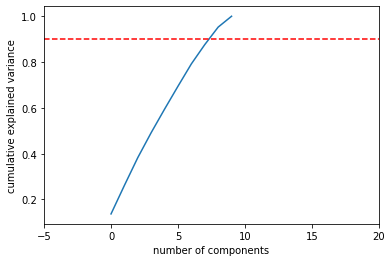

Number of components required to conserve 90% of the variance: 9


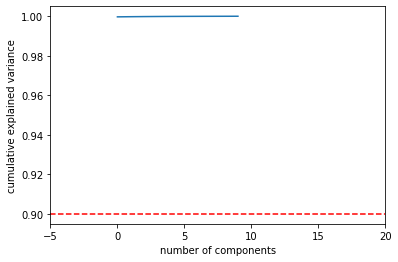

Number of components required to conserve 90% of the variance: 1


In [69]:
for fv in [li_fvae, li_fae]:
    pca = PCA().fit(fv)
    plt.plot(np.cumsum(pca.explained_variance_ratio_))
    plt.axhline(0.9, linestyle='--', color='r')
    plt.xlabel('number of components')
    plt.ylabel('cumulative explained variance')
    plt.xlim(-5, 20)
    plt.show()
    pca = PCA(0.90).fit(fv)
    print('Number of components required to conserve 90% of the variance: '+str(pca.n_components_))

In [70]:
li_fvae_pca = PCA(2).fit_transform(li_fvae)
li_fae_pca = PCA(2).fit_transform(li_fae)

li_fvae_tsne = tsne.fit_transform(li_fvae)
li_fae_tsne = tsne.fit_transform(li_fae)

In [72]:
for fv in [li_fvae_pca, li_fae_pca,
           li_fvae_tsne, li_fae_tsne]:

    #store feature vector into dataframe
    df = pd.DataFrame(fv, 
                      columns = ['Dimension 1','Dimension 2'])
    #add formulaes to be able to analyse later
    formulaes = []
    for i in [*range(0, s)]:
        formulaes.append(data.loc[i,'formula_pretty_reduced'])
    df['Formula'] = formulaes
    #add conductivity labels
    conductivity = []
    conductivity_verbose = []
    for i in [*range(0, s)]:
        conductivity.append(data.loc[i,'σ(RT)(S cm-1)'])
        if data.loc[i,'Conductor?'] == True:
            conductivity_verbose.append('Yes')
        elif data.loc[i,'Conductor?'] == False:
            conductivity_verbose.append('No')
        else:
            conductivity_verbose.append('Unknown')
    df['σ(RT)(S cm-1)'] = conductivity
    df['Conductor?'] = conductivity_verbose


    fig = px.scatter(df, x='Dimension 1', y='Dimension 2', 
                     color='Conductor?', hover_data=['σ(RT)(S cm-1)', 'Formula'],
                     color_discrete_sequence=['dodgerblue', 'limegreen', 'tomato'])

    fig.update_traces(marker=dict(size=6,
                                  line=dict(width=1,
                                            color='DarkSlateGrey')),
                      selector=dict(mode='markers'))

    #fig.write_html('clustering.html')
    fig.show()

In [80]:
i = 0

for d in [fav, fav_tot, fav_RT, fav_RTot, d_fav, first_peak_02, first_peak_05, rel_s_04]:
    if i == 0:
        li_fvae_pca_wd = np.append(li_fvae_pca, d, axis=1)
        li_fae_pca_wd = np.append(li_fae_pca, d, axis=1)
        li_fvae_tsne_wd = np.append(li_fvae_tsne, d, axis=1)
        li_fae_tsne_wd = np.append(li_fae_tsne, d, axis=1)
    else:
        li_fvae_pca_wd = np.append(li_fvae_pca_wd, d, axis=1)
        li_fae_pca_wd = np.append(li_fae_pca_wd, d, axis=1)
        li_fvae_tsne_wd = np.append(li_fvae_tsne_wd, d, axis=1)
        li_fae_tsne_wd = np.append(li_fae_tsne_wd, d, axis=1)
    i = i+1

In [78]:
li_fvae_pca2_wd = PCA(2).fit_transform(li_fvae_pca_wd)
li_fae_pca2_wd = PCA(2).fit_transform(li_fae_pca_wd)

li_fvae_tsne2_wd = tsne.fit_transform(li_fvae_tsne_wd)
li_fae_tsne2_wd = tsne.fit_transform(li_fae_tsne_wd)

In [79]:
for fv in [li_fvae_pca2_wd, li_fae_pca2_wd,
           li_fvae_tsne2_wd, li_fae_tsne2_wd]:

    print(j+1)
    #store feature vector into dataframe
    df = pd.DataFrame(fv, 
                      columns = ['Dimension 1','Dimension 2'])
    #add formulaes to be able to analyse later
    formulaes = []
    for i in [*range(0, s)]:
        formulaes.append(data.loc[i,'formula_pretty_reduced'])
    df['Formula'] = formulaes
    #add conductivity labels
    conductivity = []
    conductivity_verbose = []
    for i in [*range(0, s)]:
        conductivity.append(data.loc[i,'σ(RT)(S cm-1)'])
        if data.loc[i,'Conductor?'] == True:
            conductivity_verbose.append('Yes')
        elif data.loc[i,'Conductor?'] == False:
            conductivity_verbose.append('No')
        else:
            conductivity_verbose.append('Unknown')
    df['σ(RT)(S cm-1)'] = conductivity
    df['Conductor?'] = conductivity_verbose


    fig = px.scatter(df, x='Dimension 1', y='Dimension 2', 
                     color='Conductor?', hover_data=['σ(RT)(S cm-1)', 'Formula'],
                     color_discrete_sequence=['dodgerblue', 'limegreen', 'tomato'])

    fig.update_traces(marker=dict(size=6,
                                  line=dict(width=1,
                                            color='DarkSlateGrey')),
                      selector=dict(mode='markers'))

    #fig.write_html('clustering.html')
    fig.show()

12


12


12


12


### Clustering and Storing

Two examples for performing hierarchical clustering with known optimal number of clusters input.
The result labels are added to a new column in the dataframe

In [31]:
#Temperature independent phonon band centre with optimal no of clusters = 3
clustering_model_1 = AgglomerativeClustering(n_clusters=3, affinity='euclidean', linkage='ward')
clustering_model_1.fit(np.array(fav).reshape(-1,1))
res_1 = clustering_model_1.labels_
res_1 = pd.DataFrame(res_1)
res_1.columns = ['res_fav']
data = pd.concat([data, res_1], axis = 1)
data

/home/gkrenzer/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning:

Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead



,Unnamed: 0.1,Unnamed: 0,material_id,elements,formula_pretty_reduced,formula,num_elements,chemsys,spacegroup_symbol,spacegroup_number,...,960,970,980,990,10.1,50.1,1,5,σ(RT)(S cm-1),res_fav
0,0,0,mp-10103,"['Li', 'F', 'Al', 'Yb']",LiYbAlF6,Li2 Yb2 Al2 F12,4,Al-F-Li-Yb,P-31c,163,...,10.297958,10.298454,10.298939,10.299414,7.163927,3.668098,0.627119,0.536232,NaN,1
1,1,1,mp-10182,"['Li', 'P', 'Zn']",LiZnP,Li4 Zn4 P4,3,Li-P-Zn,F-43m,216,...,9.912183,9.912530,9.912870,9.913203,6.840771,4.568928,0.634409,0.483333,NaN,1
2,2,2,mp-10250,"['Li', 'F', 'Ba']",BaLiF3,Ba1 Li1 F3,3,Ba-F-Li,Pm-3m,221,...,6.207615,6.207853,6.208087,6.208315,2.986015,2.154856,0.794326,0.715596,NaN,2
3,3,3,mp-10251,"['Li', 'O', 'Dy']",LiDyO2,Li4 Dy4 O8,3,Dy-Li-O,P2_1/c,14,...,8.829255,8.830243,8.831211,8.832159,4.537320,2.120154,0.926667,0.567568,NaN,1
4,4,4,mp-10485,"['Li', 'Sb', 'Ba']",BaLiSb,Ba2 Li2 Sb2,3,Ba-Li-Sb,P6_3/mmc,194,...,2.230477,2.230505,2.230533,2.230561,1.200179,1.200179,0.835821,0.745763,NaN,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
868,868,868,mp-989579,"['Rb', 'Li', 'Tl', 'Cl']",Rb2LiTlCl6,Rb8 Li4 Tl4 Cl24,4,Cl-Li-Rb-Tl,Fm-3m,225,...,5.926320,5.926423,5.926523,5.926622,6.439567,6.439567,0.277027,0.136842,NaN,2
869,869,869,mp-989583,"['Rb', 'Li', 'In', 'Cl']",Rb2LiInCl6,Rb8 Li4 In4 Cl24,4,Cl-In-Li-Rb,Fm-3m,225,...,5.703089,5.703213,5.703333,5.703451,6.288178,3.342625,0.362205,0.202381,NaN,2
870,870,870,mp-9912,"['Li', 'P', 'Ce']",Li2CeP2,Li2 Ce1 P2,3,Ce-Li-P,P-3m1,164,...,9.149235,9.149458,9.149676,9.149890,5.703049,5.703049,0.648855,0.511628,NaN,1
871,871,871,mp-9915,"['Li', 'Be', 'P']",LiBeP,Li2 Be2 P2,3,Be-Li-P,P4/nmm,129,...,8.086547,8.086730,8.086909,8.087084,6.218153,6.218153,0.570312,0.661972,NaN,1


In [ ]:
#data = data.drop('res_fav', axis = 1)

In [ ]:
#Temperature dependent phonon band centre with optimal no of clusters = 2
clustering_model_2 = AgglomerativeClustering(n_clusters=2, affinity='euclidean', linkage='ward')
clustering_model_2.fit(np.array(fav_RT).reshape(-1,1))
res_2 = clustering_model_2.labels_
res_2 = pd.DataFrame(res_2)
res_2.columns = ['res_favRT']
data = pd.concat([data, res_2], axis = 1)
data

In [ ]:
#data = data.drop('res_2', axis = 1)

Save the result dataframe to a csv file

In [ ]:
data.to_csv('clustering_big.csv')